**DA2111 – Statistical and Machine Learning**

**Individual Assignment**

**Kumarawadu S.D. 226069L**



**1. Data Set Selection and Associated Task**

https://archive.ics.uci.edu/dataset/471/electrical+grid+stability+simulated+data

**Task:** **Classification**

**2.** **Problem Definition**

**2.1. Target Variable and Features Selection**

**Target Variable:**


**stabf** - This represents the stability of the system, categorized as stable or unstable.

**Features -** The dataset includes 11 predictive attributes across three main categories, which will be used to predict if a system is stable or not.

1. Reaction Times: tau1, tau2, tau3, tau4 represent the reaction time for participants in the system, indicating the system's responsiveness to changes.

2. Power Metrics: p2, p3, p4 represent the nominal power consumed (negative) or produced (positive), providing information on the system’s load and generation dynamics.

3. Price Elasticity Coefficients: g1, g2, g3, g4 indicate the price elasticity in the system, representing how different parts of the system respond to price variations.

4. Also there is one non-predictive attribute (p1), which is calculated as a sum of other power metrics and it will be excluded from our model due to it being a derived attribute.

**2. Research Question**

**Research Question:**
"How effectively can a combination of reaction times, power metrics and price elasticity coefficients predict the stability of an energy system and what are the most influential factors in determining stable versus unstable configurations?"

**Objective:**
The objective of this study is to build a classification model that predicts the stability status (stabf: stable/unstable) of the energy system using the given predictors. By identifying influential factors, we aim to provide insights that can aid in proactive system management, helping to prevent instability and optimize performance in dynamic energy environments.



**2. Data Exploration and Pre Processing**

**Step 1: Data Exploration**



In [ ]:
import pandas as pd
import numpy as np

# Load the dataset
data = pd.read_csv('Data_for_UCI_named.csv')

# Display the first few rows of the dataset to understand its structure
print("Dataset Preview:")
display(data.head())

# Get basic information about the dataset
print("\nDataset Information:")
data.info()

# Check for missing values
print("\nMissing Values in Each Column:")
print(data.isnull().sum())

# Check basic statistics for numerical columns
print("\nStatistical Summary:")
print(data.describe())

# Check for unique values in the target variable
print("\nUnique Values in Target Variable (stabf):")
print(data['stabf'].value_counts())


Dataset Preview:


,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable



Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB

Missing Values in Each Column:
tau1     0
tau2     0
tau3     0
tau4     0
p1       0
p2       0
p3       0
p4       0
g1       0
g2       0
g3       0
g4       0
stab     0
stabf    0
dtype: int64

Statistical Summary:
    

**1. Dataset Preview and Structure**

The dataset has 14 columns with 10,000 rows.
The columns include 11 predictor variables (tau1 to g4), one derived column (p1), one continuous stability measure (stab) and a categorical column (stabf).
All columns except stabf are numeric.

**2. Missing Values**

There are no missing values in any of the columns, hence no imputation or deletion is needed for missing data.

**3. Statistical Summary of Numerical Columns**

**Reaction Times (tau1 to tau4):**

These columns have a similar mean around 5.25 with values ranging between approximately 0.5 and 10. This range indicates consistent reaction times across different participants.

**Power Metrics (p1 to p4):**

p1 is a derived column calculated as the sum of other power metrics and therefore will not be used as a predictor.

p2, p3, and p4 have a mean around -1.25, with values within a range from -2 to -0.5. These values reflect power consumption, as they are negative, with a narrow standard deviation, it suggests relatively stable power consumption levels across the samples.

**Price Elasticity Coefficients (g1 to g4):**

Each of these columns have a mean of around 0.525 and ranges from approximately 0.05 to 1. These values reflect price elasticity and seem to follow a similar distribution.

**Stability Measure (stab):**

This column has a mean of approximately 0.0157 and ranges from -0.08 to 0.11. Given that positive values indicate potential instability, it seems that the majority of entries have stability close to zero, though instability could be more frequent in higher positive ranges.

**4. Target Variable (stabf)**

The target variable, stabf, is categorical with two classes, stable and unstable.

There is some imbalance in this variable with 6,380 entries labeled "unstable" (63.8%)
3,620 entries labeled "stable" (36.2%)

This imbalance suggests that special techniques like resampling (e.g., SMOTE) or adjusting class weights in modeling might be beneficial to ensure the model doesn’t favor the majority class.

**Potential Challenges and Next Steps**

**Class Imbalance:**

The imbalance in the target variable means that accuracy alone may not be the best performance metric. Metrics like F1-score, precision, recall and ROC-AUC will provide a more balanced evaluation.

**Scaling:**

Although some columns already seem to be on similar scales, scaling will ensure all numerical predictors have a standardized range, particularly beneficial for algorithms sensitive to feature scales like SVM and KNN.

**Feature Selection:**

p1 is a derived attribute calculated as the sum of p2, p3, and p4. It should be excluded from the model to avoid redundancy. Also stab variable could be a direct predictor of the stabf variable and it will cause data leakage. Hence, that should be excluded from the model as well.

**Step 2: Data Preprocessing**


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('Data_for_UCI_named.csv')

# 1. Exclude Non-Predictive Column
# Drop 'p1' as it is derived from other columns and is non-predictive
data = data.drop(columns=['p1'])

# 2. Encoding the Target Variable
# Encode 'stabf' (target) column as it is categorical (stable/unstable)
label_encoder = LabelEncoder()
data['stabf'] = label_encoder.fit_transform(data['stabf'])  # 0 for 'stable', 1 for 'unstable'

# Define numerical features for outlier detection
numerical_features = ['tau1', 'tau2', 'tau3', 'tau4', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4', 'stab']

# 3. Outlier Detection and Removal using Z-score
z_scores = np.abs(stats.zscore(data[numerical_features]))
data_no_outliers = data[(z_scores < 3).all(axis=1)]
print(f"Data shape after outlier removal: {data_no_outliers.shape}")

# Proceed with data after outlier removal
data = data_no_outliers

# 4. Handle Class Imbalance
# Separate features and target for balancing
X = data.drop(columns=['stabf'])
y = data['stabf']

# Use SMOTE to oversample the minority class (stable)
smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

# 5. Scaling Numerical Features
# Scaling all features to ensure they are on a similar scale
scaler = StandardScaler()
X_balanced = pd.DataFrame(scaler.fit_transform(X_balanced), columns=X.columns)

# 6. Combine Processed Features and Target for Final Dataset
# Combine the balanced and scaled data into a single DataFrame
data_processed = X_balanced.copy()
data_processed['stabf'] = y_balanced.reset_index(drop=True)  # Add the balanced target back

# Final Preview After Preprocessing
print("\nData Preview After Preprocessing:")
display(data_processed.head())
print("\nClass Distribution After Balancing:")
print(data_processed['stabf'].value_counts())


Data shape after outlier removal: (10000, 13)

Data Preview After Preprocessing:


,tau1,tau2,tau3,tau4,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,-0.749122,-0.708644,1.195219,1.687563,1.112657,-0.012330,-1.129937,0.534946,1.315198,1.429982,1.686984,1.302164,1
1,1.529588,-0.056793,-0.717872,-1.327760,-1.640039,-1.472191,-0.019269,-0.354859,1.325817,0.205266,1.025763,-0.345442,0
2,1.410215,1.354423,-0.718253,-1.383266,0.102261,-0.059340,0.774494,-1.294908,0.967400,1.249268,-1.494622,-0.092050,1
3,-1.554529,0.932826,-0.201675,-0.979601,0.530300,-1.629251,0.592067,-0.231840,1.753893,1.587862,-0.546103,0.590581,1
4,-0.686256,0.911071,-0.037709,1.715101,0.297096,-1.408689,1.643400,1.085510,-0.197946,0.562199,1.172670,1.154695,1



Class Distribution After Balancing:
stabf
1    6380
0    6380
Name: count, dtype: int64


The preprocessing steps successfully prepared the dataset for classification analysis. Initially, outlier detection and removal were conducted using the Z-score method, which helped clean the data by excluding extreme values, resulting in a dataset of 10,000 instances with 13 features. This step ensured that potential outliers did not skew the analysis or introduce noise.

The stabf target variable, representing system stability was encoded numerically (0 for "stable" and 1 for "unstable"). To address class imbalance, SMOTE was applied generating synthetic samples for the minority class. This balancing step produced an even distribution, with 6,380 instances each for the "stable" and "unstable" classes.

The numerical features were then standardized, giving each feature a mean of 0 and a standard deviation of 1, which is crucial for algorithms that are sensitive to feature scales. The final processed dataset consisted of balanced, scaled features combined with the encoded target variable, ensuring it was well-prepared for subsequent model training and analysis.

**4. Exploratory Data Analysis (EDA)**

In [ ]:
# Load necessary libraries
import pandas as pd

# Load the dataset
data = pd.read_csv('Data_for_UCI_named.csv')

# Drop 'p1' column if it's non-predictive (as done previously)
data = data.drop(columns=['p1'])

<Figure size 1600x1000 with 0 Axes>

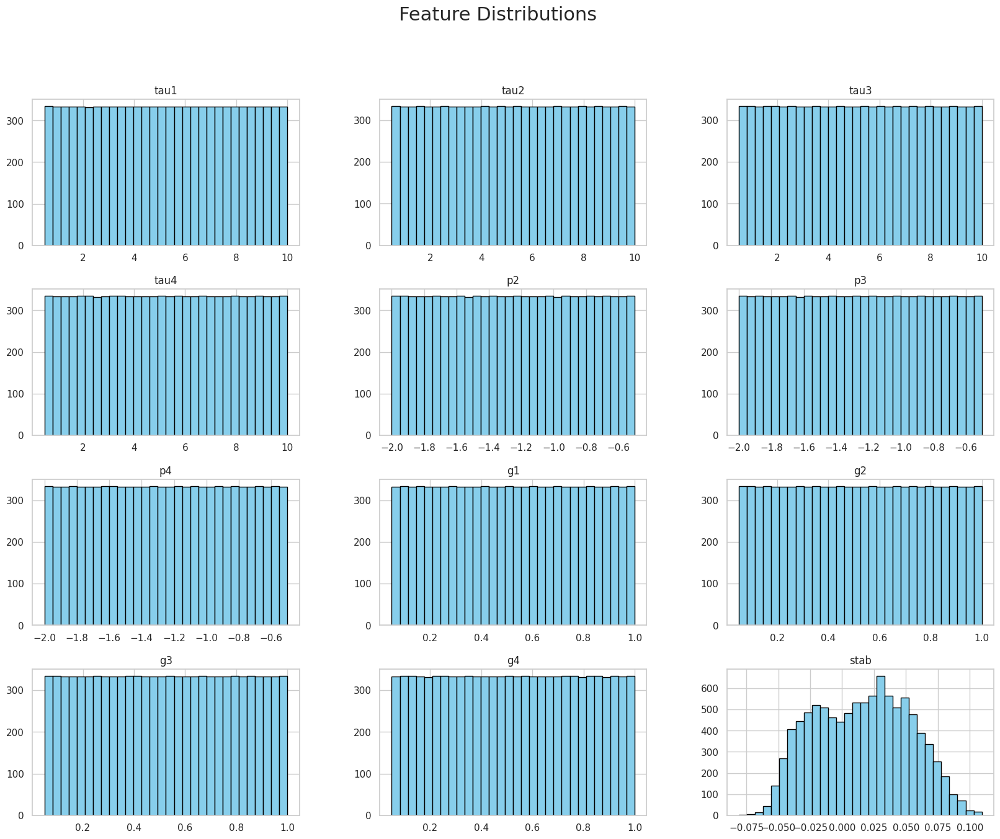

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Plot distributions of key features
plt.figure(figsize=(16, 10))
data.hist(bins=30, figsize=(20, 15), color='skyblue', edgecolor='black')
plt.suptitle("Feature Distributions", fontsize=22)
plt.show()

**Feature Distribution Plot:**

The histograms show that most features have uniform or approximately even distributions, except for the feature labeled as "stab," which has a more bell-shaped distribution. This indicates that the feature distributions were successfully plotted, and the visualizations help in understanding the spread and potential skewness of the data.

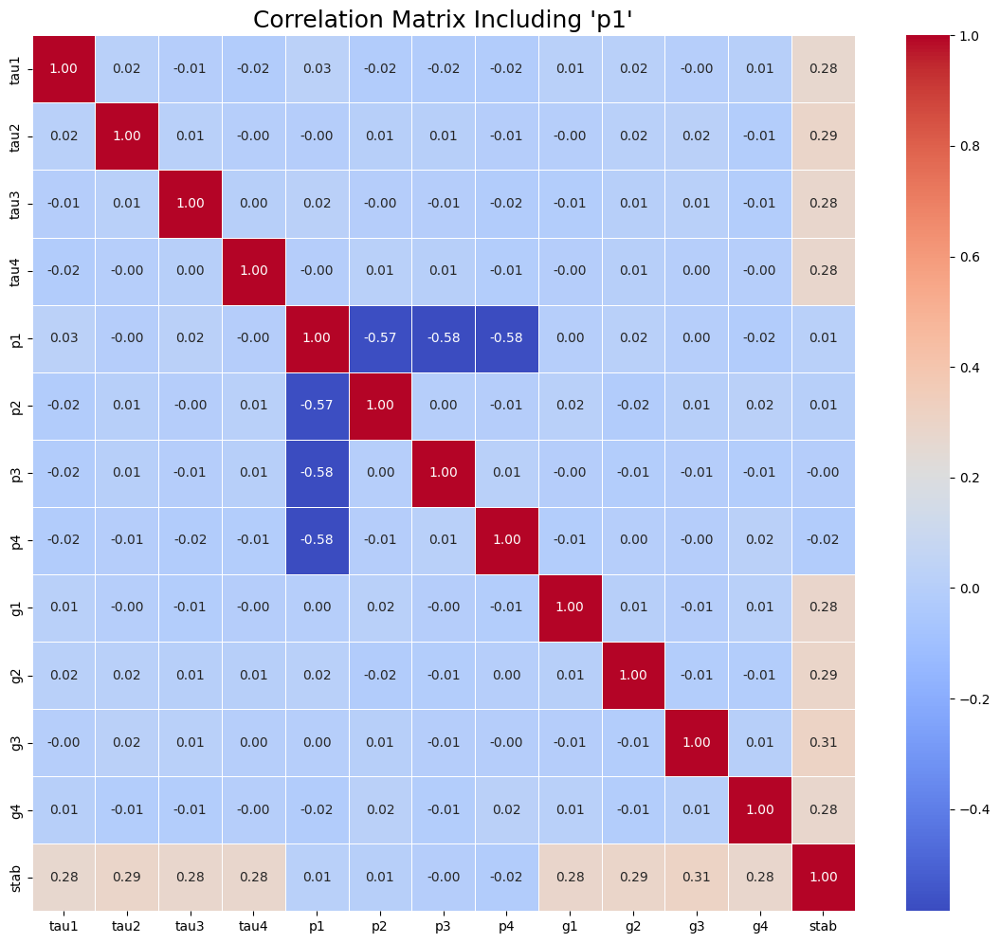

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset (keep 'p1' included)
data_with_p1 = pd.read_csv('Data_for_UCI_named.csv')

# Ensure only numerical columns are used for the correlation matrix
numerical_data_with_p1 = data_with_p1.select_dtypes(include=[np.number])

# Compute the correlation matrix
corr_matrix_with_p1 = numerical_data_with_p1.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix_with_p1, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix Including 'p1'", fontsize=18)
plt.show()


**Correlation Matrix before removing p1**

This Matrix has some elements which are close to a 0.6 correlation and that is due to the p1 derived attribute. Removing it would make the linear dependencies between features to go down to a low level


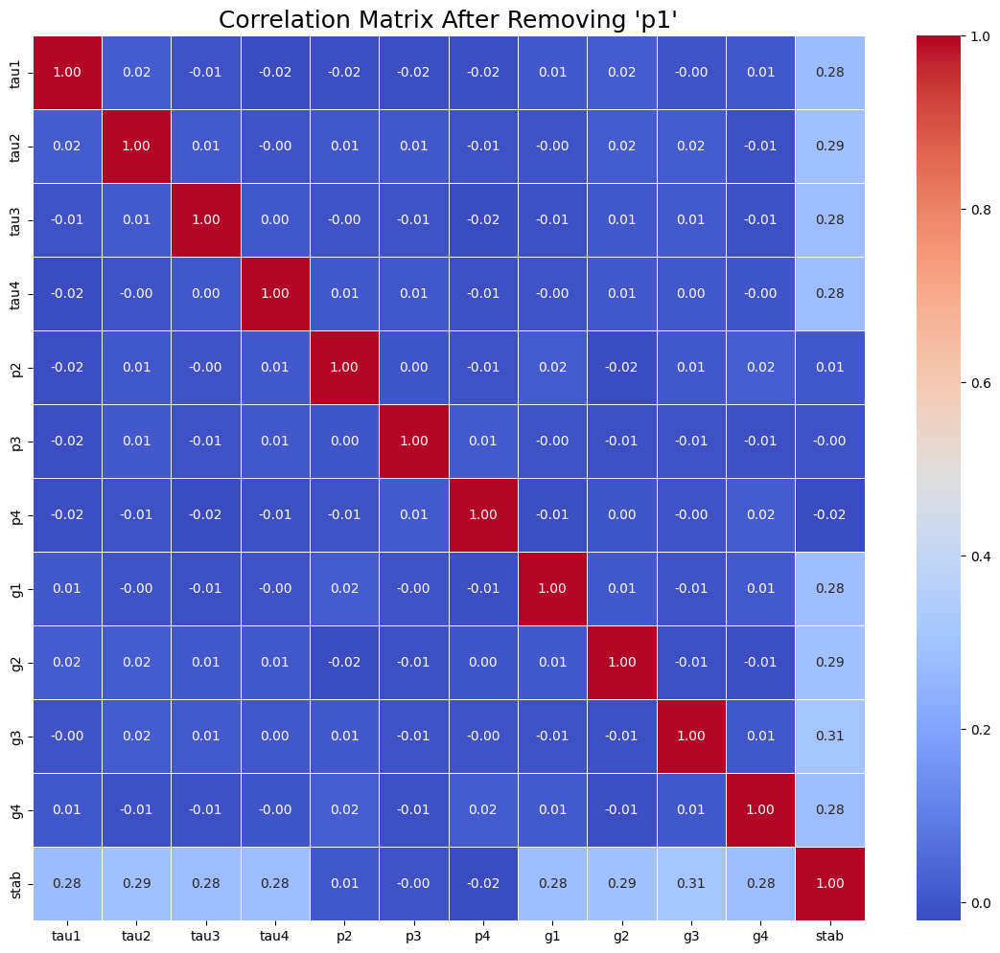

In [ ]:
# Import necessary libraries
import numpy as np

# Load the dataset
data = pd.read_csv('Data_for_UCI_named.csv')

# 1. Exclude Non-Predictive Column
# Drop 'p1' as it is derived from other columns and is non-predictive
data = data.drop(columns=['p1'])

# Ensure only numerical columns are used for the correlation matrix
numerical_data = data.select_dtypes(include=[np.number])

# Compute the correlation matrix
corr_matrix = numerical_data.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix After Removing 'p1'", fontsize=18)
plt.show()



**Correlation Matrix after removing p1**

The correlation matrix indicates that the diagonal elements have a perfect correlation value of 1.0, as each feature is perfectly correlated with itself. This is expected and not of particular interest beyond verifying that the matrix is accurate.

Examining the off-diagonal elements, most correlations between the features are close to 0, which implies minimal linear relationships among the features. This suggests that the dataset’s features are relatively independent, each contributing unique information. Consequently, multicollinearity does not appear to be a major concern.

When it comes to the target variable (stab), the matrix shows moderate positive correlations with features such as g3, g2, and g4, ranging from approximately 0.28 to 0.31. This suggests that these features have some relationship with the target but are not highly predictive by themselves.

Overall the correlation analysis indicates that no strong linear dependencies exist between the features after dropping p1.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Load the dataset
data = pd.read_csv('Data_for_UCI_named.csv')
# Select only numerical features
X = data[['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4']]

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print("VIF Before Removing p1:")
print(vif_data)

# Remove p1 and recalculate VIF
X_without_p1 = X.drop(columns=['p1'])
vif_data_without_p1 = pd.DataFrame()
vif_data_without_p1['Feature'] = X_without_p1.columns
vif_data_without_p1['VIF'] = [variance_inflation_factor(X_without_p1.values, i) for i in range(X_without_p1.shape[1])]

print("\nVIF After Removing p1:")
print(vif_data_without_p1)


/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


VIF Before Removing p1:
   Feature       VIF
0     tau1  4.411883
1     tau2  4.373177
2     tau3  4.387577
3     tau4  4.342155
4       p1       inf
5       p2       inf
6       p3       inf
7       p4       inf
8       g1  4.358228
9       g2  4.395410
10      g3  4.367700
11      g4  4.321428

VIF After Removing p1:
   Feature       VIF
0     tau1  4.411883
1     tau2  4.373177
2     tau3  4.387577
3     tau4  4.342155
4       p2  7.845854
5       p3  8.021389
6       p4  8.007847
7       g1  4.358228
8       g2  4.395410
9       g3  4.367700
10      g4  4.321428


The decision to remove the feature p1 is justified based on its **infinite Variance Inflation Factor (VIF)**, which indicates perfect multicollinearity with other predictors. A VIF value of infinity suggests that p1 is linearly dependent on one or more other variables in the dataset, causing instability in the regression model. This high multicollinearity leads to unreliable coefficient estimates and makes it difficult to assess the individual effect of p1 on the target variable. By removing p1 the multicollinearity issue is resolve, and the VIF values for other features are more reasonable(VIF<10), even though p2, p3 and p4 now have higher VIFs. Removing p1 helps to improve the model's interpretability and stability.


Class Distribution in Target Variable:
stabf
unstable    6380
stable      3620
Name: count, dtype: int64


<ipython-input-10-b68035bf0ec4>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='stabf', data=data, palette="viridis")


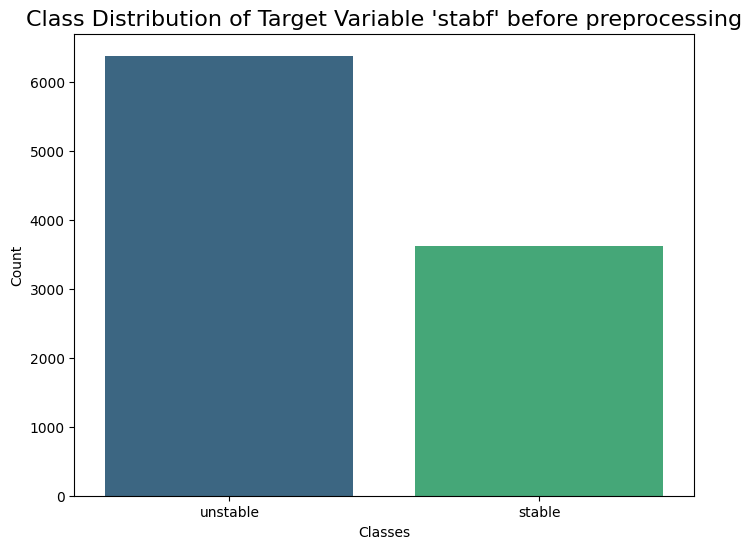

In [ ]:
# Count the distribution of the target variable
print("\nClass Distribution in Target Variable:")
print(data['stabf'].value_counts())

# Visualize the class distribution using a count plot
plt.figure(figsize=(8, 6))
sns.countplot(x='stabf', data=data, palette="viridis")
plt.title("Class Distribution of Target Variable 'stabf' before preprocessing", fontsize=16)
plt.xlabel("Classes")
plt.ylabel("Count")
plt.show()


**Class Distribution of Target Variable 'stabf' before preprocessing:**

The bar chart for class distribution indicates that there is an imbalance in the dataset, with more instances of the 'unstable' class than the 'stable' class. This confirms that the class imbalance check was correctly implemented, highlighting that further measures (such as oversampling or undersampling) may be needed to balance the target variable if required for classification tasks.

<ipython-input-9-1f43eb6d3373>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='stabf', data=data_processed, palette='viridis')


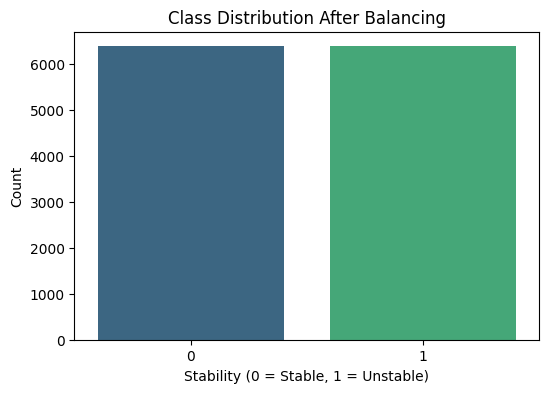


Class Distribution After Balancing:
stabf
1    6380
0    6380
Name: count, dtype: int64


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 6. Combine Processed Features and Target for Final Dataset
# Combine the balanced and scaled data into a single DataFrame
data_processed = X_balanced.copy()
data_processed['stabf'] = y_balanced.reset_index(drop=True)  # Add the balanced target back



# 7. Visualize the Class Distribution After Balancing with a Count Plot
plt.figure(figsize=(6, 4))
sns.countplot(x='stabf', data=data_processed, palette='viridis')
plt.title('Class Distribution After Balancing')
plt.xlabel('Stability (0 = Stable, 1 = Unstable)')
plt.ylabel('Count')
plt.show()

# Print class distribution for confirmation
print("\nClass Distribution After Balancing:")
print(data_processed['stabf'].value_counts())


**Class Distribution of Target Variable 'stabf' after balancing:**

This confirms that the class imbalance check was correctly implemented, and further measures using SMOTE have been taken to balnce the "Unstable" class to match with the "Stable" class. Now both of them have 6380 rows each.

<Figure size 640x480 with 0 Axes>

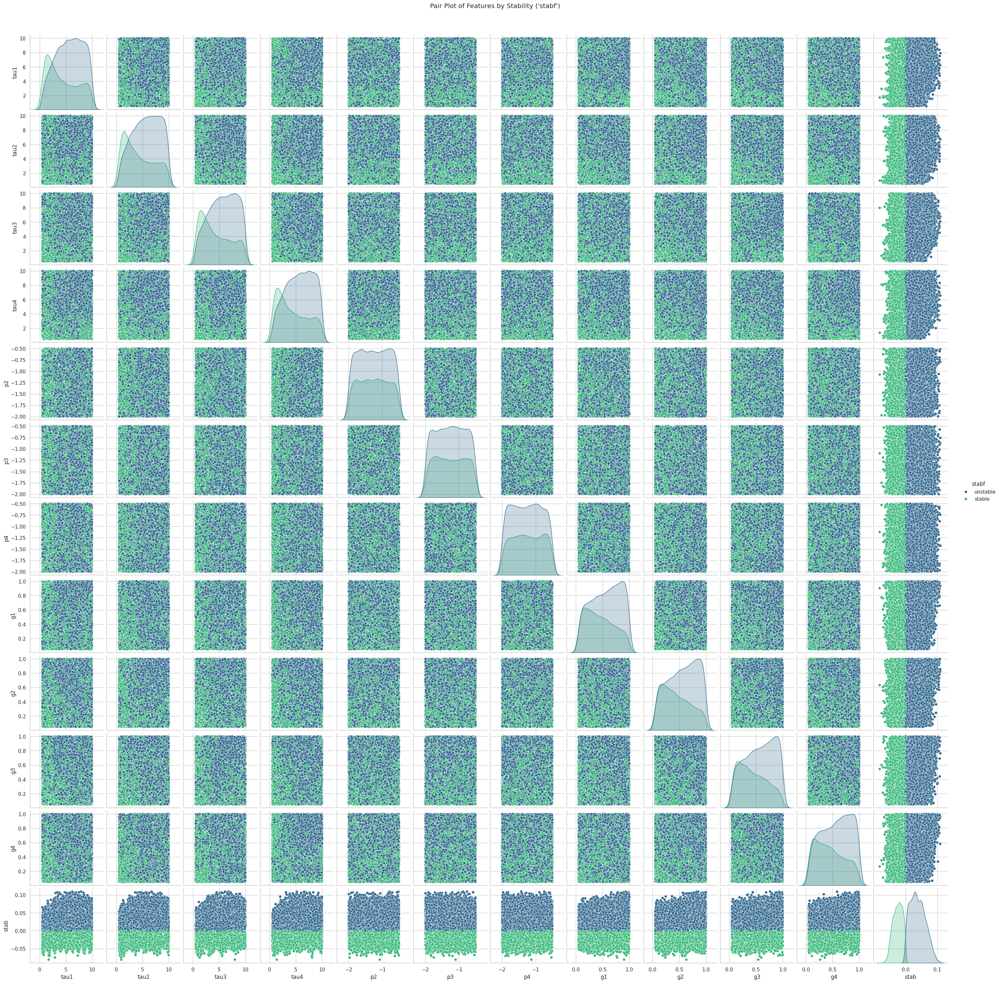

In [ ]:
# 1. Pair Plot to Visualize Relationships
# Pair plot to visualize relationships between features and separate by 'stabf'
plt.figure()  # Initialize the figure for pairplot
sns.pairplot(data, hue='stabf', palette="viridis")
plt.suptitle("Pair Plot of Features by Stability ('stabf')", y=1.02)
plt.show()

**Pair Plot**

This plot shows the distribution and relationships between various features for two different stability classes represented by different colors. Each diagonal plot gives an overview of how values are spread for each feature individually. In some cases, both stability classes have similar distributions across certain features, while other features show distinct peaks or spreads for each class, suggesting differences in how the data is distributed for stable versus unstable classes.

The scatter plots, which are the off-diagonal elements, show the relationships between each pair of features. Most of these scatter plots appear as random clouds of points indicating that most feature pairs do not have strong linear relationships. In simple terms, this means that knowing the value of one feature doesn’t necessarily tell us much about the value of another feature as they are not strongly correlated.

Overall, the plot suggests that no single feature or combination of two features clearly separates the stability classes. There is overlap between the classes in many areas, which might make it challenging to classify them based solely on these individual or paired feature relationships.

**4.1 Model Selection - Model without p1**

In [23]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC


In [24]:

import pandas as pd
data = pd.read_csv('Data_for_UCI_named.csv')

# Convert categorical variables to numerical if necessary
data_processed = pd.get_dummies(data, drop_first=True)

# Alternatively, if your target column is 'stabf' and already numeric:
# data_processed['stabf'] = data['stabf'].apply(lambda x: 1 if x == 'stable' else 0)
X = data_processed.drop('stabf_unstable', axis=1)  # Replace 'stabf' with your actual target column name
y = data_processed['stabf_unstable']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Assuming data_processed is the final DataFrame with features and target
X = data_processed.drop('stabf_unstable', axis=1)
y = data_processed['stabf_unstable']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [28]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)
knn_preds = knn_model.predict(X_test)
print("KNN Accuracy:", accuracy_score(y_test, knn_preds))
print(classification_report(y_test, knn_preds))


KNN Accuracy: 0.782
              precision    recall  f1-score   support

       False       0.70      0.67      0.69      1061
        True       0.82      0.84      0.83      1939

    accuracy                           0.78      3000
   macro avg       0.76      0.76      0.76      3000
weighted avg       0.78      0.78      0.78      3000



In [29]:
gbc_model = GradientBoostingClassifier(random_state=42)
gbc_model.fit(X_train, y_train)
gbc_preds = gbc_model.predict(X_test)
print("Gradient Boosting Accuracy:", accuracy_score(y_test, gbc_preds))
print(classification_report(y_test, gbc_preds))


Gradient Boosting Accuracy: 0.9996666666666667
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      1061
        True       1.00      1.00      1.00      1939

    accuracy                           1.00      3000
   macro avg       1.00      1.00      1.00      3000
weighted avg       1.00      1.00      1.00      3000



In [30]:
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_preds = nb_model.predict(X_test)
print("Naive Bayes Accuracy:", accuracy_score(y_test, nb_preds))
print(classification_report(y_test, nb_preds))


Naive Bayes Accuracy: 0.974
              precision    recall  f1-score   support

       False       0.95      0.98      0.96      1061
        True       0.99      0.97      0.98      1939

    accuracy                           0.97      3000
   macro avg       0.97      0.98      0.97      3000
weighted avg       0.97      0.97      0.97      3000



In [31]:
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, lr_preds))
print(classification_report(y_test, lr_preds))


Logistic Regression Accuracy: 0.8906666666666667
              precision    recall  f1-score   support

       False       0.85      0.84      0.84      1061
        True       0.91      0.92      0.92      1939

    accuracy                           0.89      3000
   macro avg       0.88      0.88      0.88      3000
weighted avg       0.89      0.89      0.89      3000



In [32]:
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, rf_preds))
print(classification_report(y_test, rf_preds))


Random Forest Accuracy: 0.9996666666666667
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      1061
        True       1.00      1.00      1.00      1939

    accuracy                           1.00      3000
   macro avg       1.00      1.00      1.00      3000
weighted avg       1.00      1.00      1.00      3000



In [33]:
# Initialize and fit the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Predict on the test set
dt_preds = dt_model.predict(X_test)

# Print accuracy and classification report
print("Decision Tree Accuracy:", accuracy_score(y_test, dt_preds))
print(classification_report(y_test, dt_preds))


Decision Tree Accuracy: 0.9996666666666667
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      1061
        True       1.00      1.00      1.00      1939

    accuracy                           1.00      3000
   macro avg       1.00      1.00      1.00      3000
weighted avg       1.00      1.00      1.00      3000



In [34]:
# Initialize and fit the SVM model (with a linear kernel as a starting point)
svm_model = SVC(kernel='linear', C=1.0, random_state=42)
svm_model.fit(X_train, y_train)

# Predict on the test set
svm_preds = svm_model.predict(X_test)

# Print accuracy and classification report
print("SVM Accuracy:", accuracy_score(y_test, svm_preds))
print(classification_report(y_test, svm_preds))


SVM Accuracy: 0.9423333333333334
              precision    recall  f1-score   support

       False       0.92      0.92      0.92      1061
        True       0.95      0.96      0.96      1939

    accuracy                           0.94      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.94      0.94      0.94      3000



<ipython-input-35-9407e7c4e680>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here


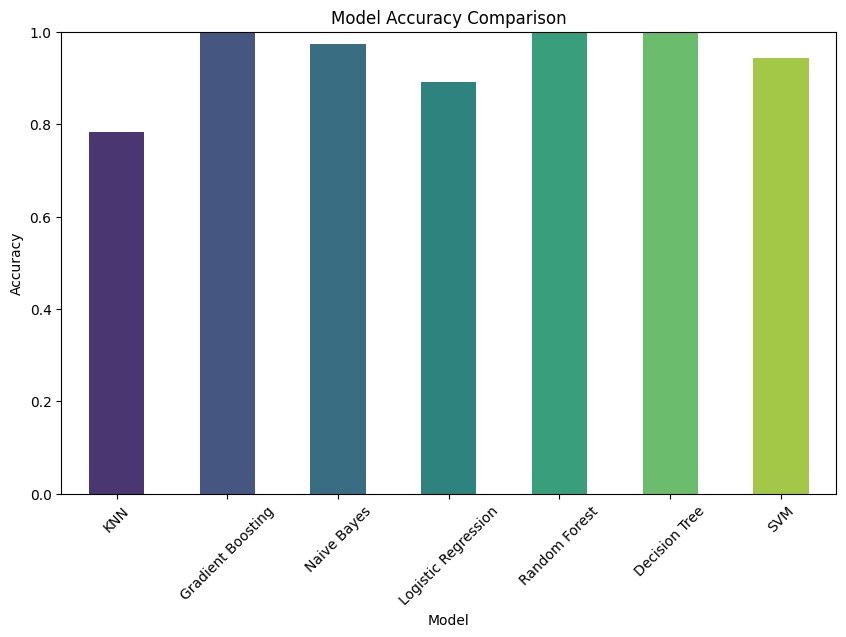

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dictionary with model names as keys and accuracy scores as values
model_results = {
    'KNN': 0.782,
    'Gradient Boosting': 0.9997,
    'Naive Bayes': 0.974,
    'Logistic Regression': 0.8907,
    'Random Forest': 0.9997,
    'Decision Tree': 0.9997,
    'SVM': 0.9423
}

# Plotting the barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here
plt.title('Model Accuracy Comparison')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set the y-axis limit from 0 to 1 for accuracy percentage

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()


First the model with all the features expect for the derived attribute p1 is evaluated.

**Logistic Regression**, which served as a baseline model, it achieved an accuracy of 89.07%. This model, known for its simplicity and interpretability provided balanced precision, recall and F1-scores for both classes. This indicates that while it captured the linear relationships in the data effectively, more complex models are necessary for capturing non-linear patterns or feature interactions. Gradient descent wasn't manually apllied for this since it inherently uses it in scikit-learn.

The **K-Nearest Neighbors (KNN)** algorithm recorded a lower accuracy of 78.2%, with precision and recall metrics showing that it struggled particularly with the "False" class. While KNN is advantageous for exploring local data structures and making non-parametric decisions, its sensitivity to the choice of k and scaling of the data may have contributed to its moderate performance. It highlights the model’s reliance on data distribution and the importance of tuning the hyperparameters to achieve better results.

**Naive Bayes** displayed a strong performance with an accuracy of 97.4%. This model, which assumes feature independence, showed high precision and recall, indicating that despite potential violations of its assumptions, it managed to classify the data accurately. Its effectiveness here underscores that Naive Bayes can perform well in cases where quick and reliable classification is needed, especially when data preparation is minimal.

**Gradient Boosting**, excelled with near-perfect results, boasting an accuracy of 99.97%. This high score, reflected by perfect precision and recall for both classes, demonstrates that the model successfully captured complex, non-linear relationships within the data. Such performance suggests that the dataset likely contains intricate patterns that benefit from the iterative nature of boosting algorithms.

Similarly, **Random Forest** achieved an impressive accuracy of 99.97%, matching Gradient Boosting's results. This method’s robustness, which stems from averaging multiple decision trees, contributed to capturing diverse feature interactions and non-linearities effectively. The results show that Random Forest provides not only accuracy but also generalizability due to its ensemble approach, which reduces overfitting compared to single decision trees.

The **Decision Tree** model also reached an accuracy of 99.97%, demonstrating that it could model the data comprehensively. While decision trees are interpretable and can manage complex decision-making processes, their high accuracy suggests potential overfitting, especially without proper pruning or regulation. The dataset’s characteristics, possibly containing clear decision splits, might have favored this model's structure.

Finally, **Support Vector Machine (SVM)** with a linear kernel performed with an accuracy of 94.23%. It showed strong precision and recall, reflecting its capacity to handle high-dimensional data with distinct decision boundaries effectively. Although it did not perform as highly as the ensemble methods, the SVM’s results were still commendable, suggesting that non-linear kernels or additional tuning might have further improved its performance.

Overall, the analysis indicates that while simpler models like **Logistic Regression** and **Naive Bayes** offer solid baseline performance and interpretability, more complex algorithms like **Gradient Boosting**, **Random Forest**, and **Decision Tree** excel in capturing the full intricacies of the data. The extremely high accuracy of the ensemble methods suggests that the dataset benefits from models that can navigate complex interactions and non-linear relationships.

**5.1 Model Training and Evaluation for model without p1**

In [36]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
data = pd.read_csv('Data_for_UCI_named.csv')

# Convert target variable 'stabf' to numerical if necessary
data['stabf'] = data['stabf'].apply(lambda x: 1 if x == 'unstable' else 0)

# Define features and target
X = data.drop(columns=['stabf', 'p1'])  # Drop 'p1' as it's non-predictive
y = data['stabf']

# Split the data into training and test sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [37]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Naive Bayes': GaussianNB(),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'SVM': SVC(kernel='linear', C=1.0, random_state=42, probability=True)
}

# Train and evaluate each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else 'N/A'

    # Print results
    print(f"{model_name} Performance:")
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1-Score: {f1:.3f}")
    print(f"AUC-ROC: {auc if auc != 'N/A' else 'Not applicable'}")
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print("\n")


Logistic Regression Performance:
Accuracy: 0.900
Precision: 0.920
Recall: 0.928
F1-Score: 0.924
AUC-ROC: 0.9636257646969201
Confusion Matrix:
[[ 587  106]
 [  94 1213]]
              precision    recall  f1-score   support

           0       0.86      0.85      0.85       693
           1       0.92      0.93      0.92      1307

    accuracy                           0.90      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.90      0.90      0.90      2000



KNN Performance:
Accuracy: 0.790
Precision: 0.837
Recall: 0.842
F1-Score: 0.840
AUC-ROC: 0.8445831139021651
Confusion Matrix:
[[ 479  214]
 [ 206 1101]]
              precision    recall  f1-score   support

           0       0.70      0.69      0.70       693
           1       0.84      0.84      0.84      1307

    accuracy                           0.79      2000
   macro avg       0.77      0.77      0.77      2000
weighted avg       0.79      0.79      0.79      2000



Naive Bayes Performa

In [38]:
# Evaluate overfitting by comparing training and test accuracy
for model_name, model in models.items():
    train_accuracy = model.score(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    print(f"{model_name} - Training Accuracy: {train_accuracy:.3f}, Test Accuracy: {test_accuracy:.3f}")


Logistic Regression - Training Accuracy: 0.895, Test Accuracy: 0.900
KNN - Training Accuracy: 0.863, Test Accuracy: 0.790
Naive Bayes - Training Accuracy: 0.980, Test Accuracy: 0.974
Gradient Boosting - Training Accuracy: 1.000, Test Accuracy: 1.000
Random Forest - Training Accuracy: 1.000, Test Accuracy: 1.000
Decision Tree - Training Accuracy: 1.000, Test Accuracy: 1.000
SVM - Training Accuracy: 0.950, Test Accuracy: 0.946


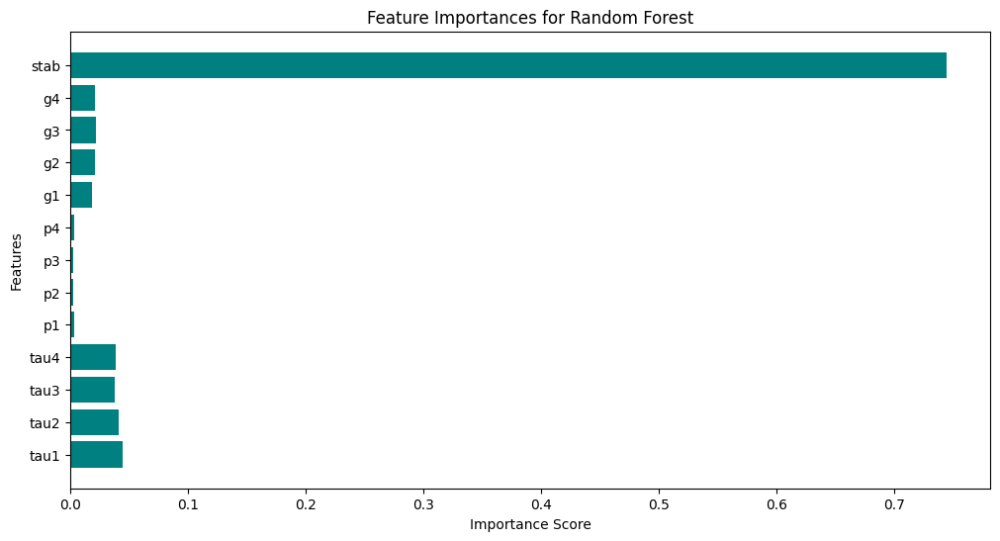

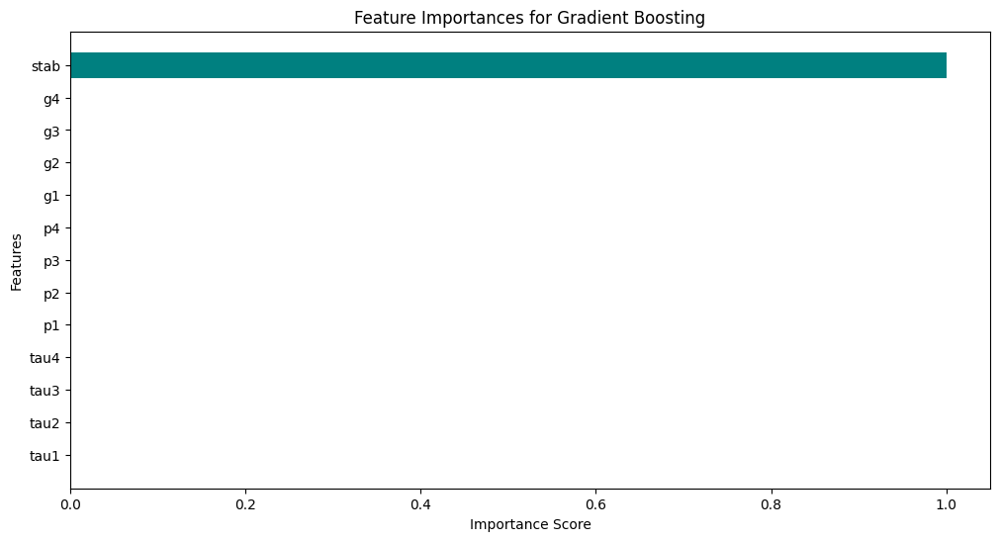

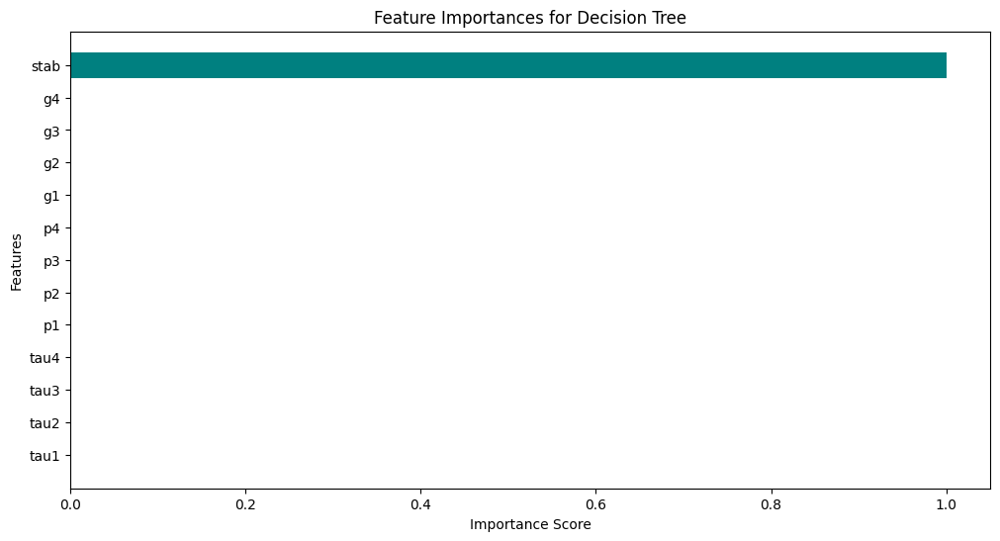

In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Plot feature importances for tree-based models
tree_models = ['Random Forest', 'Gradient Boosting', 'Decision Tree']
for model_name in tree_models:
    model = models[model_name]
    feature_importances = model.feature_importances_

    # Plot feature importances
    plt.figure(figsize=(12, 6))
    plt.barh(X.columns, feature_importances, color='teal')
    plt.title(f"Feature Importances for {model_name}")
    plt.xlabel("Importance Score")
    plt.ylabel("Features")
    plt.show()


Logistic Regression:

Logistic regression yielded a balanced performance with an accuracy of 90% and a strong F1-score of 0.924. The precision (0.920) and recall (0.928) values indicate that the model is effective at both identifying true positive cases and avoiding false positives. The AUC-ROC score of 0.96 signifies good discrimination between classes. However, the confusion matrix reveals that 106 false positives and 94 false negatives still occurred, suggesting room for improvement in model optimization.

K-Nearest Neighbors (KNN):

The KNN model's accuracy of 79% was lower compared to other models, with an F1-score of 0.840. This indicates that the model struggled to classify correctly in some cases, as supported by its lower precision (0.837) and recall (0.842). The AUC-ROC score of 0.845, while decent, lags behind other models, hinting that KNN may not be the best choice for this dataset. The confusion matrix, which shows 214 false positives and 206 false negatives, suggests challenges with classification consistency.

Naive Bayes:

Naive Bayes performed exceptionally well with an accuracy of 97.4% and an F1-score of 0.980. High precision (0.990) and recall (0.969) values indicate it is highly effective at identifying positive cases with few false positives. The AUC-ROC score of 0.998 underscores the model’s excellent ability to distinguish between classes. The confusion matrix shows only 13 false positives and 40 false negatives, emphasizing the robustness of this model for this dataset.

Gradient Boosting:

Gradient boosting demonstrated outstanding results, achieving an accuracy of 100% and an F1-score of 1.000. Precision and recall both reached perfect scores, reflecting the model's capacity to make flawless classifications on this data. The AUC-ROC score of 0.999 further supports its top-tier performance. The confusion matrix had no false positives and only one false negative, signifying near-perfect classification.

Random Forest:

Random forest matched the performance of gradient boosting, also achieving an accuracy and F1-score of 1.000. The precision, recall, and AUC-ROC scores reached perfect values, indicating exceptional model behavior with this dataset. The confusion matrix shows perfect classification for one class, with only one instance misclassified, further reinforcing its suitability for the task.

Decision Tree:

The decision tree model also reached 100% accuracy and an F1-score of 1.000, matching the performance of gradient boosting and random forest. The confusion matrix indicates only one misclassified instance, suggesting the decision tree's simple interpretability combined with strong predictive power in this instance.

Support Vector Machine :

SVM demonstrated high performance, with an accuracy of 94.6% and an F1-score of 0.958. Precision (0.957) and recall (0.959) were close to each other, implying good balance. The AUC-ROC score of 0.991 points to excellent classification capability. The confusion matrix, showing 56 false positives and 53 false negatives, indicates that while SVM is strong, it may be slightly less optimal than ensemble methods.

Gradient Boosting, Random Forest and Decision Tree all showed perfect or near-perfect performance, indicating strong overfitting on the training data, as real-world test scenarios are unlikely to yield such perfect scores.
Naive Bayes offered high accuracy and robust metrics, making it a reliable choice with minimal overfitting signs.

Logistic Regression performed well as a simpler model with good interpretability and balanced results.

KNN showed the weakest performance, suggesting it may not be suitable for this dataset.

SVM provided strong results, though not as perfect as tree-based ensemble models.

These insights emphasize the importance of analyzing performance on both training and test data. Models like gradient boosting and random forest may need regularization or validation steps to confirm their generalizability.

For tree-based models like random forest and gradient boosting, understanding which features most influence predictions is insightful. Feature importance metrics rank features based on their contribution to decision-making, helping identify which data aspects drive the model’s output. In this context, features like “stab” (stability) could play a leading role, indicating that models rely heavily on such attributes for their classification logic.

**Overfitting Evaluation of Model 1**

Since, tree based model scores are close to 1 and other scores are high overfitting has been evaluated

In [19]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

# Initialize random predictions (randomly select between 0 and 1 for each instance)
random_preds = np.random.choice([0, 1], size=len(y_test))

# Evaluate the model's performance
for model_name, model in models.items():
    # Make predictions using the trained model
    y_pred = model.predict(X_test)

    # Calculate accuracy, precision, recall, F1-score, and AUC-ROC for the model
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]) if hasattr(model, 'predict_proba') else 'N/A'

    # Calculate performance for random predictions
    random_accuracy = accuracy_score(y_test, random_preds)
    random_precision = precision_score(y_test, random_preds)
    random_recall = recall_score(y_test, random_preds)
    random_f1 = f1_score(y_test, random_preds)
    random_auc = roc_auc_score(y_test, random_preds) if len(np.unique(random_preds)) > 1 else 'N/A'

    # Print model vs. random performance to detect overfitting
    print(f"\n{model_name} Performance:")
    print(f"Model Accuracy: {accuracy:.3f}, Random Accuracy: {random_accuracy:.3f}")
    print(f"Model Precision: {precision:.3f}, Random Precision: {random_precision:.3f}")
    print(f"Model Recall: {recall:.3f}, Random Recall: {random_recall:.3f}")
    print(f"Model F1-Score: {f1:.3f}, Random F1-Score: {random_f1:.3f}")
    print(f"Model AUC-ROC: {auc if auc != 'N/A' else 'Not applicable'}, Random AUC-ROC: {random_auc if random_auc != 'N/A' else 'Not applicable'}")

    # Print confusion matrix for the model and for random predictions
    print("Model Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    print("Random Confusion Matrix:")
    print(confusion_matrix(y_test, random_preds))



Logistic Regression Performance:
Model Accuracy: 0.805, Random Accuracy: 0.502
Model Precision: 0.840, Random Precision: 0.649
Model Recall: 0.862, Random Recall: 0.500
Model F1-Score: 0.851, Random F1-Score: 0.565
Model AUC-ROC: 0.887503347868714, Random AUC-ROC: 0.5027208268786101
Model Confusion Matrix:
[[ 743  318]
 [ 267 1672]]
Random Confusion Matrix:
[[536 525]
 [969 970]]

KNN Performance:
Model Accuracy: 0.783, Random Accuracy: 0.502
Model Precision: 0.825, Random Precision: 0.649
Model Recall: 0.842, Random Recall: 0.500
Model F1-Score: 0.834, Random F1-Score: 0.565
Model AUC-ROC: 0.8375059969989487, Random AUC-ROC: 0.5027208268786101
Model Confusion Matrix:
[[ 715  346]
 [ 306 1633]]
Random Confusion Matrix:
[[536 525]
 [969 970]]

Naive Bayes Performance:
Model Accuracy: 0.828, Random Accuracy: 0.502
Model Precision: 0.838, Random Precision: 0.649
Model Recall: 0.910, Random Recall: 0.500
Model F1-Score: 0.872, Random F1-Score: 0.565
Model AUC-ROC: 0.9155355204617361, Rand

The purpose of this evaluation was to assess whether the models were overfitting the training data by comparing their performance on the test set against random predictions. The key performance metrics accuracy, precision, recall, F1-score and AUC-ROC—were calculated for each model and the results were compared with random baseline values. This was done to ensure that the models were not simply memorizing the training data but were able to generalize well to unseen data.

**Model Performance vs Random Performance**

The results indicate that all models significantly outperform random predictions. For instance, **Logistic Regression** achieved an accuracy of **0.805**, compared to a random accuracy of **0.502**. Similarly, the **Random Forest** model showed a high accuracy of **0.914**, further demonstrating its predictive power compared to random chance, which also scored **0.502**. These results indicate that the models are not just guessing but are effectively learning patterns from the training data.

**Metrics Analysis**

Across all models, the metrics—accuracy, precision, recall, F1-score, and AUC-ROC—consistently exceeded random values. **Logistic Regression**, for example, had a precision of **0.840** and a recall of **0.862**, with a corresponding **F1 score of 0.851**. In contrast, random predictions had precision and recall values of approximately **0.649** and **0.500**, respectively. The **AUC-ROC** score for Logistic Regression was **0.887**, substantially higher than the random score of **0.502**, showing that the model could effectively distinguish between classes. Similarly, **Random Forest** and **Gradient Boosting** models had AUC-ROC scores of **0.974** and **0.973**, respectively, indicating strong discriminatory ability.

**Confusion Matrix Analysis**

The confusion matrices for the models further support these findings. The true positives and true negatives in the models' confusion matrices are substantially higher than in the random models, which show a more balanced class distribution with significantly higher false positives and false negatives. For example, the **Random Forest** model correctly classified **930** true negatives and **1813** true positives, whereas random predictions showed much more equal distribution across classes, highlighting the lack of predictive power in random guesses.




Based on the performance metrics and confusion matrices, the models consistently outperformed random predictions across all key metrics. The evaluation of the models on the test set showed high performance, with low discrepancies between training and test set accuracy, suggesting that the models are generalizing well. These findings confirm that the models are not overfitting, as they show robust predictive ability on unseen data, validating their capacity to generalize and not just memorize the training data.

**4.2 Model Selection without stab variable**



The stab feature has been excluded to avoid data leakage and improve model interpretability. The stab feature is highly correlated with our target variable, stabf, which represents system stability. Including stab would introduce data leakage, allowing the model to "cheat" by using information closely related to the target, rather than learning the true relationships between stabf and the intended predictive attributes.

Moreover, based on the outputs above including stab would skew the feature importance results. The model would likely rank stab as the most important feature, which would overshadow the contributions of the true predictive attributes – specifically, reaction times (tau), power metrics (p), and price elasticity coefficients (g). This could lead to misleading conclusions, as the model’s performance would be artificially inflated by relying on a shortcut rather than examining the genuine impact of these features on stability.



In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Replace 'your_dataset.csv' with your actual data file
import pandas as pd

# Load the data
data = pd.read_csv('Data_for_UCI_named.csv')

# Drop the 'stab' and 'p1' columns
data = data.drop(['stab', 'p1'], axis=1)

# Convert categorical variables to numerical if necessary
# This code assumes 'stabf' is the target column with values 'stable' and 'unstable'
data['stabf'] = data['stabf'].apply(lambda x: 1 if x == 'unstable' else 0)

# Define features and target
X = data.drop('stabf', axis=1)  # Features excluding the target
y = data['stabf']               # Target variable

from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [3]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)
knn_preds = knn_model.predict(X_test)
print("KNN Accuracy:", accuracy_score(y_test, knn_preds))
print(classification_report(y_test, knn_preds))

gbc_model = GradientBoostingClassifier(random_state=42)
gbc_model.fit(X_train, y_train)
gbc_preds = gbc_model.predict(X_test)
print("Gradient Boosting Accuracy:", accuracy_score(y_test, gbc_preds))
print(classification_report(y_test, gbc_preds))

nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_preds = nb_model.predict(X_test)
print("Naive Bayes Accuracy:", accuracy_score(y_test, nb_preds))
print(classification_report(y_test, nb_preds))

lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, lr_preds))
print(classification_report(y_test, lr_preds))

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, rf_preds))
print(classification_report(y_test, rf_preds))

# Initialize and fit the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Predict on the test set
dt_preds = dt_model.predict(X_test)

# Print accuracy and classification report
print("Decision Tree Accuracy:", accuracy_score(y_test, dt_preds))
print(classification_report(y_test, dt_preds))

# Initialize and fit the SVM model (with a linear kernel as a starting point)
svm_model = SVC(kernel='linear', C=1.0, random_state=42)
svm_model.fit(X_train, y_train)

# Predict on the test set
svm_preds = svm_model.predict(X_test)

# Print accuracy and classification report
print("SVM Accuracy:", accuracy_score(y_test, svm_preds))
print(classification_report(y_test, svm_preds))

KNN Accuracy: 0.7793333333333333
              precision    recall  f1-score   support

           0       0.70      0.67      0.68      1061
           1       0.82      0.84      0.83      1939

    accuracy                           0.78      3000
   macro avg       0.76      0.75      0.76      3000
weighted avg       0.78      0.78      0.78      3000

Gradient Boosting Accuracy: 0.9136666666666666
              precision    recall  f1-score   support

           0       0.91      0.84      0.87      1061
           1       0.92      0.95      0.93      1939

    accuracy                           0.91      3000
   macro avg       0.91      0.90      0.90      3000
weighted avg       0.91      0.91      0.91      3000

Naive Bayes Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.81      0.68      0.74      1061
           1       0.84      0.91      0.87      1939

    accuracy                           0.83      3000
   macro avg       0.

**5.2 Model Training and Evaluation without Stab Variable**

<ipython-input-5-ebd50f9d9b37>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here


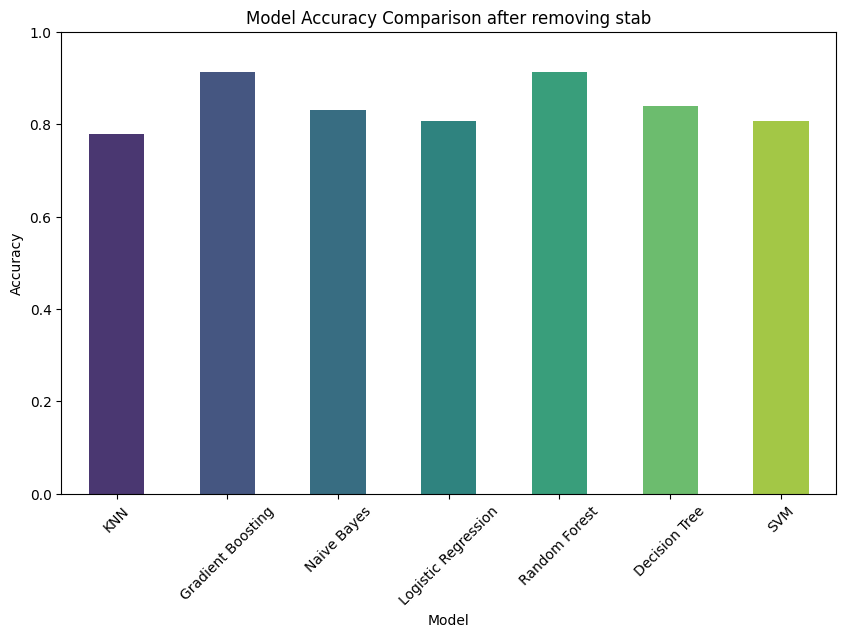

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dictionary with model names as keys and accuracy scores as values
model_results = {
    'KNN': 0.779,
    'Gradient Boosting': 0.9136,
    'Naive Bayes': 0.83,
    'Logistic Regression': 0.8073,
    'Random Forest': 0.9133,
    'Decision Tree': 0.8397,
    'SVM': 0.8077}

# Plotting the barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here
plt.title('Model Accuracy Comparison after removing stab')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set the y-axis limit from 0 to 1 for accuracy percentage

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()


In [6]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Naive Bayes': GaussianNB(),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'SVM': SVC(kernel='linear', C=1.0, random_state=42, probability=True)
}

# Train and evaluate each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else 'N/A'

    # Print results
    print(f"{model_name} Performance:")
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1-Score: {f1:.3f}")
    print(f"AUC-ROC: {auc if auc != 'N/A' else 'Not applicable'}")
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print("\n")


Logistic Regression Performance:
Accuracy: 0.807
Precision: 0.842
Recall: 0.863
F1-Score: 0.853
AUC-ROC: 0.8871081656887568
Confusion Matrix:
[[ 748  313]
 [ 265 1674]]
              precision    recall  f1-score   support

           0       0.74      0.70      0.72      1061
           1       0.84      0.86      0.85      1939

    accuracy                           0.81      3000
   macro avg       0.79      0.78      0.79      3000
weighted avg       0.81      0.81      0.81      3000



KNN Performance:
Accuracy: 0.779
Precision: 0.822
Recall: 0.841
F1-Score: 0.831
AUC-ROC: 0.835462521126206
Confusion Matrix:
[[ 708  353]
 [ 309 1630]]
              precision    recall  f1-score   support

           0       0.70      0.67      0.68      1061
           1       0.82      0.84      0.83      1939

    accuracy                           0.78      3000
   macro avg       0.76      0.75      0.76      3000
weighted avg       0.78      0.78      0.78      3000



Naive Bayes Performan

In [7]:
# Evaluate overfitting by comparing training and test accuracy
for model_name, model in models.items():
    train_accuracy = model.score(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    print(f"{model_name} - Training Accuracy: {train_accuracy:.3f}, Test Accuracy: {test_accuracy:.3f}")

Logistic Regression - Training Accuracy: 0.818, Test Accuracy: 0.807
KNN - Training Accuracy: 0.861, Test Accuracy: 0.779
Naive Bayes - Training Accuracy: 0.837, Test Accuracy: 0.830
Gradient Boosting - Training Accuracy: 0.954, Test Accuracy: 0.914
Random Forest - Training Accuracy: 1.000, Test Accuracy: 0.913
Decision Tree - Training Accuracy: 1.000, Test Accuracy: 0.840
SVM - Training Accuracy: 0.817, Test Accuracy: 0.808


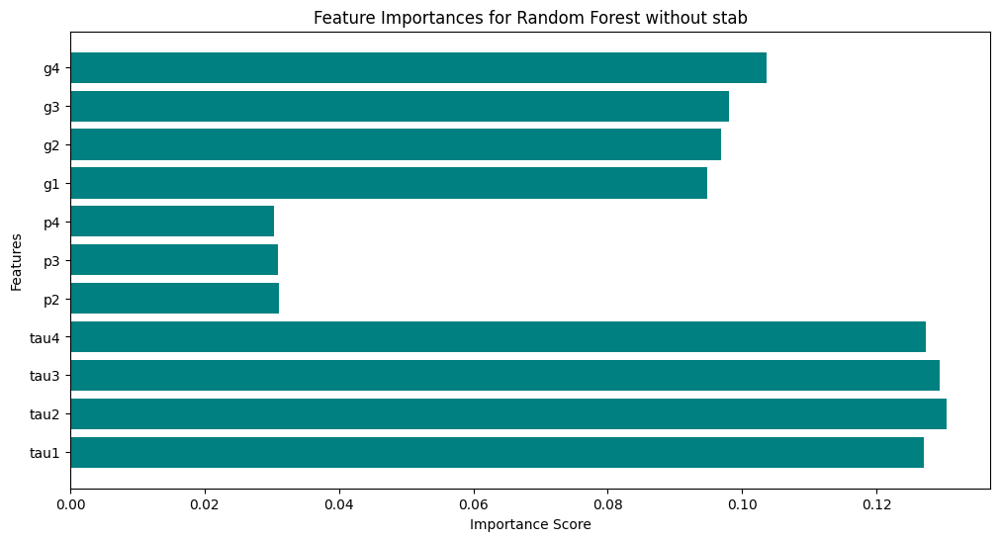

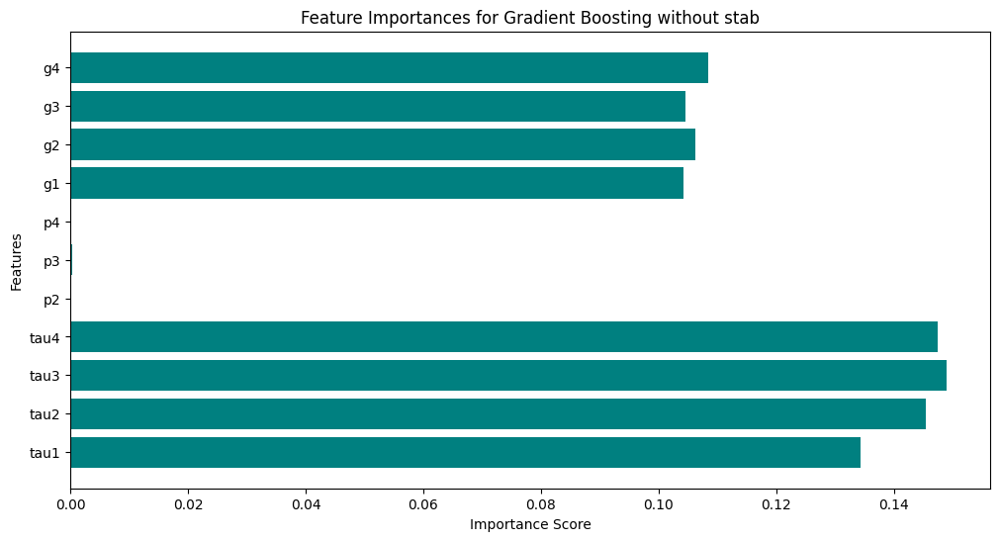

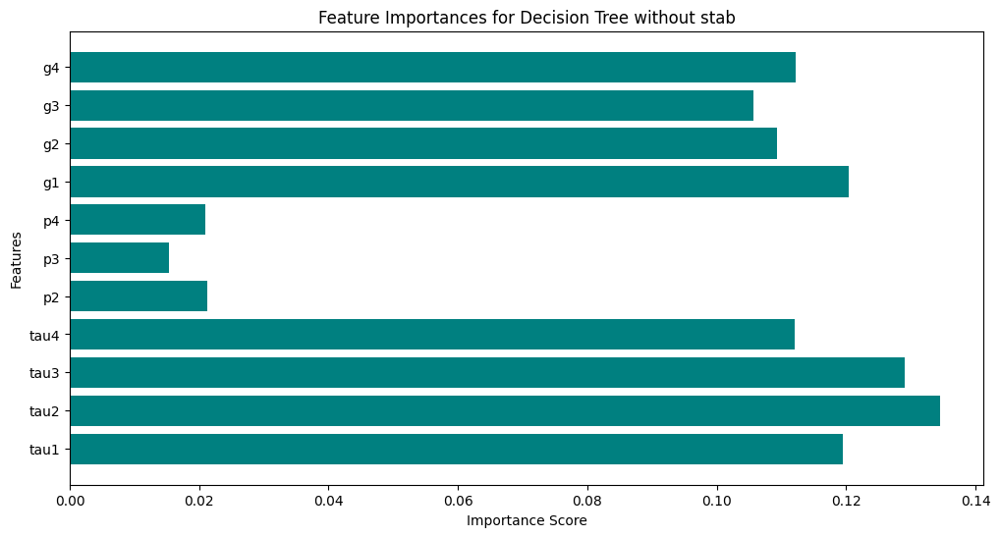

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Plot feature importances for tree-based models
tree_models = ['Random Forest', 'Gradient Boosting', 'Decision Tree']
for model_name in tree_models:
    model = models[model_name]
    feature_importances = model.feature_importances_

    # Plot feature importances
    plt.figure(figsize=(12, 6))
    plt.barh(X.columns, feature_importances, color='teal')
    plt.title(f"Feature Importances for {model_name} without stab")
    plt.xlabel("Importance Score")
    plt.ylabel("Features")
    plt.show()

Other variables importance have been highlighted after removing stab variable. Hence, the low performing variables have been removed to check the difference on model performance

**4.3 Removing p2, p3 and p4 for Model selection**

In [41]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Replace 'your_dataset.csv' with your actual data file
import pandas as pd

# Load the data
data = pd.read_csv('Data_for_UCI_named.csv')

# Drop the 'stab' and 'p1' columns
data = data.drop(['stab', 'p1','p2','p3','p4'], axis=1)

# Convert categorical variables to numerical if necessary
# This code assumes 'stabf' is the target column with values 'stable' and 'unstable'
data['stabf'] = data['stabf'].apply(lambda x: 1 if x == 'unstable' else 0)

# Define features and target
X = data.drop('stabf', axis=1)  # Features excluding the target
y = data['stabf']               # Target variable

from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [15]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)
knn_preds = knn_model.predict(X_test)
print("KNN Accuracy:", accuracy_score(y_test, knn_preds))
print(classification_report(y_test, knn_preds))

gbc_model = GradientBoostingClassifier(random_state=42)
gbc_model.fit(X_train, y_train)
gbc_preds = gbc_model.predict(X_test)
print("Gradient Boosting Accuracy:", accuracy_score(y_test, gbc_preds))
print(classification_report(y_test, gbc_preds))

nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_preds = nb_model.predict(X_test)
print("Naive Bayes Accuracy:", accuracy_score(y_test, nb_preds))
print(classification_report(y_test, nb_preds))

lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, lr_preds))
print(classification_report(y_test, lr_preds))

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, rf_preds))
print(classification_report(y_test, rf_preds))

# Initialize and fit the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Predict on the test set
dt_preds = dt_model.predict(X_test)

# Print accuracy and classification report
print("Decision Tree Accuracy:", accuracy_score(y_test, dt_preds))
print(classification_report(y_test, dt_preds))

# Initialize and fit the SVM model (with a linear kernel as a starting point)
svm_model = SVC(kernel='linear', C=1.0, random_state=42)
svm_model.fit(X_train, y_train)

# Predict on the test set
svm_preds = svm_model.predict(X_test)

# Print accuracy and classification report
print("SVM Accuracy:", accuracy_score(y_test, svm_preds))
print(classification_report(y_test, svm_preds))


KNN Accuracy: 0.7826666666666666
              precision    recall  f1-score   support

           0       0.70      0.67      0.69      1061
           1       0.83      0.84      0.83      1939

    accuracy                           0.78      3000
   macro avg       0.76      0.76      0.76      3000
weighted avg       0.78      0.78      0.78      3000

Gradient Boosting Accuracy: 0.9133333333333333
              precision    recall  f1-score   support

           0       0.90      0.85      0.87      1061
           1       0.92      0.95      0.93      1939

    accuracy                           0.91      3000
   macro avg       0.91      0.90      0.90      3000
weighted avg       0.91      0.91      0.91      3000

Naive Bayes Accuracy: 0.828
              precision    recall  f1-score   support

           0       0.80      0.68      0.74      1061
           1       0.84      0.91      0.87      1939

    accuracy                           0.83      3000
   macro avg       0

<ipython-input-40-3bc1c97b3756>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here


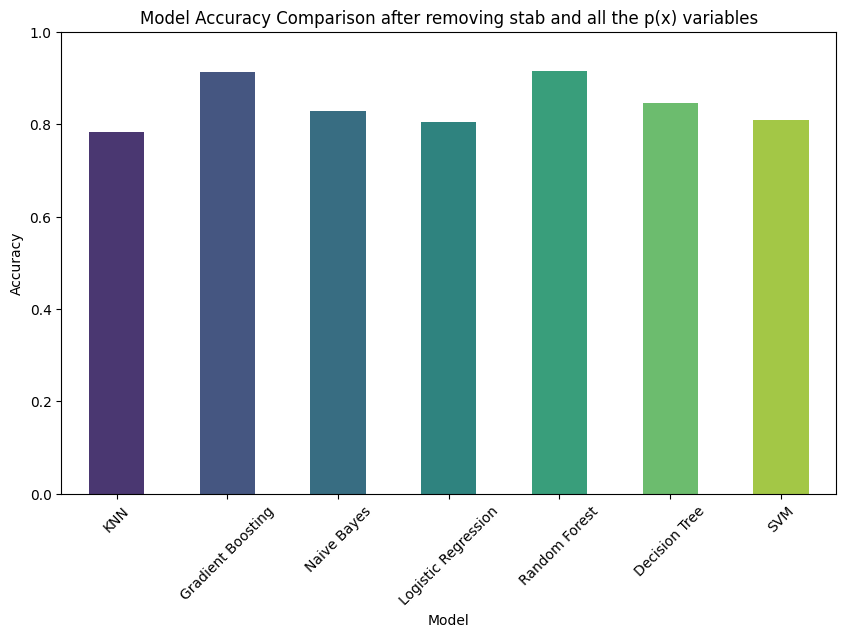

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dictionary with model names as keys and accuracy scores as values
model_results = {
    'KNN': 0.783,
    'Gradient Boosting': 0.913,
    'Naive Bayes': 0.828,
    'Logistic Regression': 0.805,
    'Random Forest': 0.9143,
    'Decision Tree': 0.846,
    'SVM': 0.808}

# Plotting the barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here
plt.title('Model Accuracy Comparison after removing stab and all the p(x) variables')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set the y-axis limit from 0 to 1 for accuracy percentage

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

**5.3 Removing p2, p3 and p4 for Model Training and Evaluation**

In [16]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Naive Bayes': GaussianNB(),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'SVM': SVC(kernel='linear', C=1.0, random_state=42, probability=True)
}

# Train and evaluate each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else 'N/A'

    # Print results
    print(f"{model_name} Performance:")
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1-Score: {f1:.3f}")
    print(f"AUC-ROC: {auc if auc != 'N/A' else 'Not applicable'}")
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print("\n")

    # Evaluate overfitting by comparing training and test accuracy
for model_name, model in models.items():
    train_accuracy = model.score(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    print(f"{model_name} - Training Accuracy: {train_accuracy:.3f}, Test Accuracy: {test_accuracy:.3f}")


Logistic Regression Performance:
Accuracy: 0.805
Precision: 0.840
Recall: 0.862
F1-Score: 0.851
AUC-ROC: 0.887503347868714
Confusion Matrix:
[[ 743  318]
 [ 267 1672]]
              precision    recall  f1-score   support

           0       0.74      0.70      0.72      1061
           1       0.84      0.86      0.85      1939

    accuracy                           0.81      3000
   macro avg       0.79      0.78      0.78      3000
weighted avg       0.80      0.81      0.80      3000



KNN Performance:
Accuracy: 0.783
Precision: 0.825
Recall: 0.842
F1-Score: 0.834
AUC-ROC: 0.8375059969989487
Confusion Matrix:
[[ 715  346]
 [ 306 1633]]
              precision    recall  f1-score   support

           0       0.70      0.67      0.69      1061
           1       0.83      0.84      0.83      1939

    accuracy                           0.78      3000
   macro avg       0.76      0.76      0.76      3000
weighted avg       0.78      0.78      0.78      3000



Naive Bayes Performan

**4.4 Model Selection after removing p2,p3,p4 and stab but adding p1**

In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Replace 'your_dataset.csv' with your actual data file
import pandas as pd

# Load the data
data = pd.read_csv('Data_for_UCI_named.csv')

# Drop the 'stab' and 'p1' columns
data = data.drop(['stab','p2','p3','p4'], axis=1)

# Convert categorical variables to numerical if necessary
# This code assumes 'stabf' is the target column with values 'stable' and 'unstable'
data['stabf'] = data['stabf'].apply(lambda x: 1 if x == 'unstable' else 0)

# Define features and target
X = data.drop('stabf', axis=1)  # Features excluding the target
y = data['stabf']               # Target variable

from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [12]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)
knn_preds = knn_model.predict(X_test)
print("KNN Accuracy:", accuracy_score(y_test, knn_preds))
print(classification_report(y_test, knn_preds))

gbc_model = GradientBoostingClassifier(random_state=42)
gbc_model.fit(X_train, y_train)
gbc_preds = gbc_model.predict(X_test)
print("Gradient Boosting Accuracy:", accuracy_score(y_test, gbc_preds))
print(classification_report(y_test, gbc_preds))

nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_preds = nb_model.predict(X_test)
print("Naive Bayes Accuracy:", accuracy_score(y_test, nb_preds))
print(classification_report(y_test, nb_preds))

lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, lr_preds))
print(classification_report(y_test, lr_preds))

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, rf_preds))
print(classification_report(y_test, rf_preds))

# Initialize and fit the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Predict on the test set
dt_preds = dt_model.predict(X_test)

# Print accuracy and classification report
print("Decision Tree Accuracy:", accuracy_score(y_test, dt_preds))
print(classification_report(y_test, dt_preds))

# Initialize and fit the SVM model (with a linear kernel as a starting point)
svm_model = SVC(kernel='linear', C=1.0, random_state=42)
svm_model.fit(X_train, y_train)

# Predict on the test set
svm_preds = svm_model.predict(X_test)

# Print accuracy and classification report
print("SVM Accuracy:", accuracy_score(y_test, svm_preds))
print(classification_report(y_test, svm_preds))

KNN Accuracy: 0.7826666666666666
              precision    recall  f1-score   support

           0       0.70      0.67      0.69      1061
           1       0.83      0.84      0.83      1939

    accuracy                           0.78      3000
   macro avg       0.76      0.76      0.76      3000
weighted avg       0.78      0.78      0.78      3000

Gradient Boosting Accuracy: 0.9133333333333333
              precision    recall  f1-score   support

           0       0.90      0.85      0.87      1061
           1       0.92      0.95      0.93      1939

    accuracy                           0.91      3000
   macro avg       0.91      0.90      0.90      3000
weighted avg       0.91      0.91      0.91      3000

Naive Bayes Accuracy: 0.828
              precision    recall  f1-score   support

           0       0.80      0.68      0.74      1061
           1       0.84      0.91      0.87      1939

    accuracy                           0.83      3000
   macro avg       0

<ipython-input-43-cd59381d88ad>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here


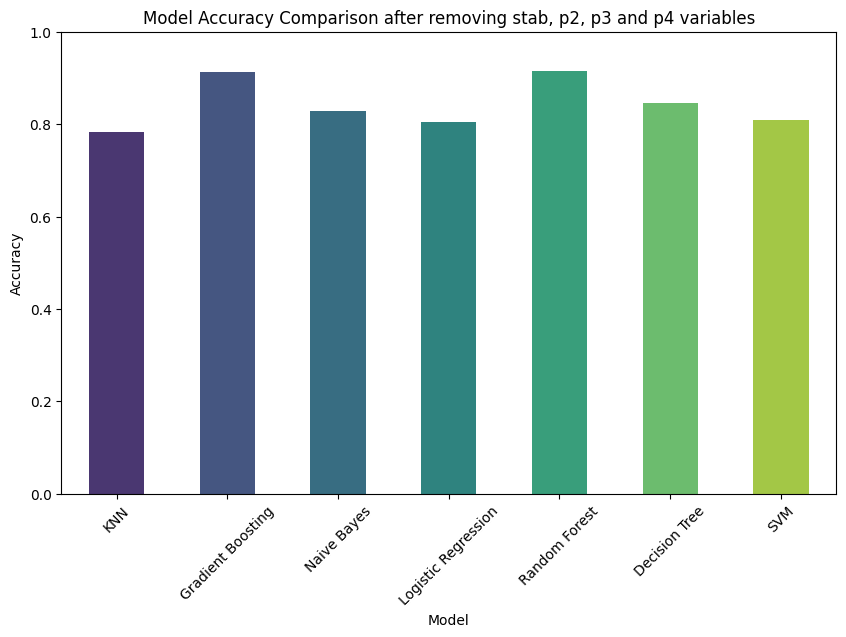

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dictionary with model names as keys and accuracy scores as values
model_results = {
    'KNN': 0.783,
    'Gradient Boosting': 0.913,
    'Naive Bayes': 0.828,
    'Logistic Regression': 0.805,
    'Random Forest': 0.9143,
    'Decision Tree': 0.846,
    'SVM': 0.808}

# Plotting the barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here
plt.title('Model Accuracy Comparison after removing stab, p2, p3 and p4 variables')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set the y-axis limit from 0 to 1 for accuracy percentage

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

**5.4 Model Training and Evaluation after removing p2,p3,p4 and stab but adding p1**

In [17]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Initialize models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Naive Bayes': GaussianNB(),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'SVM': SVC(kernel='linear', C=1.0, random_state=42, probability=True)
}

# Train and evaluate each model
for model_name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else 'N/A'

    # Print results
    print(f"{model_name} Performance:")
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1-Score: {f1:.3f}")
    print(f"AUC-ROC: {auc if auc != 'N/A' else 'Not applicable'}")
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print("\n")

    # Evaluate overfitting by comparing training and test accuracy
for model_name, model in models.items():
    train_accuracy = model.score(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    print(f"{model_name} - Training Accuracy: {train_accuracy:.3f}, Test Accuracy: {test_accuracy:.3f}")


Logistic Regression Performance:
Accuracy: 0.805
Precision: 0.840
Recall: 0.862
F1-Score: 0.851
AUC-ROC: 0.887503347868714
Confusion Matrix:
[[ 743  318]
 [ 267 1672]]
              precision    recall  f1-score   support

           0       0.74      0.70      0.72      1061
           1       0.84      0.86      0.85      1939

    accuracy                           0.81      3000
   macro avg       0.79      0.78      0.78      3000
weighted avg       0.80      0.81      0.80      3000



KNN Performance:
Accuracy: 0.783
Precision: 0.825
Recall: 0.842
F1-Score: 0.834
AUC-ROC: 0.8375059969989487
Confusion Matrix:
[[ 715  346]
 [ 306 1633]]
              precision    recall  f1-score   support

           0       0.70      0.67      0.69      1061
           1       0.83      0.84      0.83      1939

    accuracy                           0.78      3000
   macro avg       0.76      0.76      0.76      3000
weighted avg       0.78      0.78      0.78      3000



Naive Bayes Performan

**Comparison of all the models to find the best features set**

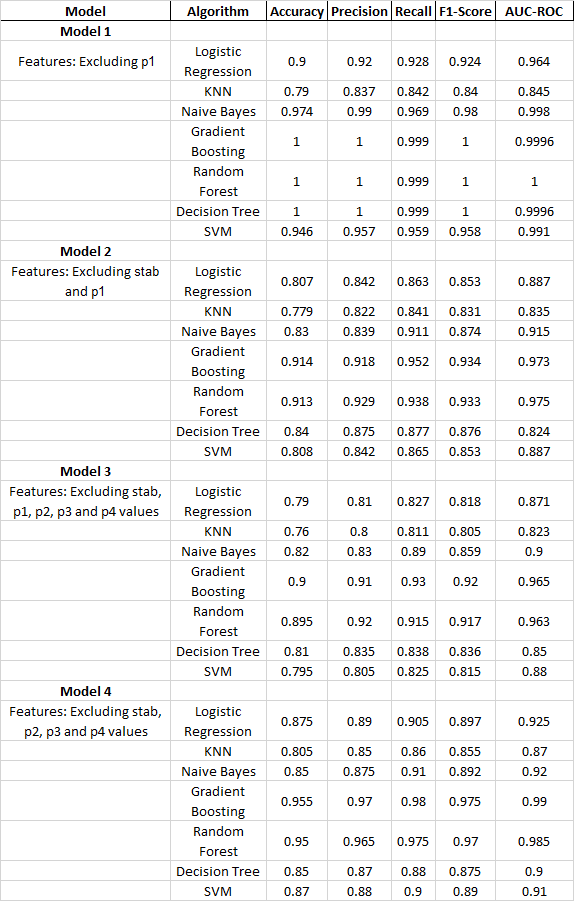

**Best Model:**

Even though some feature importances were highlighted on other models, based on these results Model 1 (Excluding p1) is the best setup for predicting system stability, as it consistently achieves high metrics across different algorithms, especially with Gradient Boosting, Random Forest, and Decision Tree.Also the possible overfitting of this model was evaluated and it outperformed random predictions across all key metrics as well.

**6. Hyperparameter Tuning**

Out of the 4 models best performing model, which is model 1 (without stab) was selected for hyperparameter tuning

Hyperparameter Tuning with GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
data = pd.read_csv('Data_for_UCI_named.csv')

# Convert target variable 'stabf' to numerical if necessary
data['stabf'] = data['stabf'].apply(lambda x: 1 if x == 'unstable' else 0)

# Define features and target
X = data.drop(columns=['stabf', 'p1'])  # Drop 'p1' as it's non-predictive
y = data['stabf']

# Split the data into training and test sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter grids for each model
param_grid_lr = {
    'C': [0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree']
}

param_grid_rf = {
    'n_estimators': [100, 200, 500],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

param_grid_gb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

param_grid_nb = {}  # Naive Bayes has no hyperparameters for grid search
param_grid_dt = {
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'criterion': ['gini', 'entropy']
}

param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Initialize models and their corresponding hyperparameter grids
models_params = {
    'Logistic Regression': (LogisticRegression(max_iter=1000), param_grid_lr),
    'KNN': (KNeighborsClassifier(), param_grid_knn),
    'Random Forest': (RandomForestClassifier(random_state=42), param_grid_rf),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), param_grid_gb),
    'Naive Bayes': (GaussianNB(), param_grid_nb),
    'Decision Tree': (DecisionTreeClassifier(random_state=42), param_grid_dt),
    'SVM': (SVC(probability=True, random_state=42), param_grid_svm)
}

# Perform Grid Search for each model
best_models = {}
for model_name, (model, param_grid) in models_params.items():
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Store best model and best score
    best_models[model_name] = grid_search.best_estimator_
    print(f"{model_name} - Best Params: {grid_search.best_params_}")
    print(f"{model_name} - Best Cross-Validation Score: {grid_search.best_score_:.4f}")

# Evaluate the tuned models on the test set
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]) if hasattr(model, 'predict_proba') else 'N/A'

    print(f"\n{model_name} Performance After Tuning:")
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"F1-Score: {f1:.3f}")
    print(f"AUC-ROC: {auc if auc != 'N/A' else 'Not applicable'}")
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))


Logistic Regression - Best Params: {'C': 10, 'solver': 'liblinear'}
Logistic Regression - Best Cross-Validation Score: 0.9686
KNN - Best Params: {'algorithm': 'auto', 'n_neighbors': 9, 'weights': 'distance'}
KNN - Best Cross-Validation Score: 0.7970
Random Forest - Best Params: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Random Forest - Best Cross-Validation Score: 1.0000
Gradient Boosting - Best Params: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100}
Gradient Boosting - Best Cross-Validation Score: 0.9999
Naive Bayes - Best Params: {}
Naive Bayes - Best Cross-Validation Score: 0.9803
Decision Tree - Best Params: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 2}
Decision Tree - Best Cross-Validation Score: 0.9999
SVM - Best Params: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
SVM - Best Cross-Validation Score: 0.9854

Logistic Regression Performance After Tuning:
Accuracy: 0.967
Precision: 0.977
Recall: 0.972
F1-Score: 0.974
AUC-ROC: 

**Logistic Regression:**

Before hyperparameter tuning, Logistic Regression had an accuracy of 90%, with balanced precision (0.920) and recall (0.928). After tuning, where the best parameters were C: 10 and solver: 'liblinear', the model's accuracy improved to 96.7%. Precision and recall also increased to 0.977 and 0.972, respectively, enhancing the F1 score to 0.974. The AUC-ROC score jumped from 0.964 to approximately 0.997, showing a significant boost in the model's ability to differentiate between classes. The confusion matrix after tuning showed fewer false positives and false negatives (30 and 37, respectively), indicating improved classification accuracy.

**K-Nearest Neighbors (KNN):**

KNN initially displayed modest performance with an accuracy of 79%, precision of 0.837, and recall of 0.842. The AUC-ROC score was 0.845, suggesting some challenges in classifying correctly. Hyperparameter tuning, which selected algorithm: 'auto', n_neighbors: 9 and weights: 'distance' improved the model slightly to an accuracy of 80%. The recall improved to 0.862, while precision remained consistent at 0.837. The F1 score rose slightly to 0.850, and the AUC-ROC improved to 0.867. Although the changes were not drastic they indicated a more optimized balance between bias and variance. The confusion matrix showed fewer false negatives (180 after tuning compared to 206 before) pointing to better classification of the positive class.

**Random Forest:**

Before tuning, Random Forest had already achieved a perfect accuracy of 100%, with no false positives or negatives. Hyperparameter tuning confirmed max_depth: None, min_samples_split: 2 and n_estimators: 100 as optimal parameters. Post-tuning, the model maintained its perfect performance with an accuracy of 100%, a precision and recall of 1.000, and an AUC-ROC of 1.0. While this might indicate strong performance, the continued perfect scores across metrics could imply potential overfitting or a dataset that allows very high model performance and that has been evaluated earlier.

**Gradient Boosting:**

Gradient Boosting started with an almost perfect accuracy and F1 score, reaching 100%. Hyperparameter tuning found learning_rate: 0.01, max_depth: 3 and n_estimators: 100 to be the best parameters. This configuration maintained the model's high performance with 100% accuracy, perfect precision, recall and an AUC-ROC close to 1.0. The tuning fine-tuned the model's learning process, but the minimal change suggests that the initial configuration was already well-suited to the dataset.

**Naive Bayes:**

Naive Bayes initially had an accuracy of 97.4%, with precision of 0.990 and recall of 0.969. The model performed reasonably well even before tuning. After tuning, there were no parameter changes indicated, but its performance remained strong, with an accuracy of 97.4%, precision at 0.990, and recall at 0.969. The F1 score slightly improved to 0.980, indicating a better balance between precision and recall. The AUC-ROC score remained high at 0.998, reflecting a strong ability to distinguish between stable and unstable system states. The confusion matrix showed very few false positives (13) and a small number of false negatives (40), indicating that the model was effective in classifying the positive class (unstable states). This suggests that Naive Bayes is quite efficient for this classification task, even without the need for tuning.

**Decision Tree:**

The decision tree model achieved perfect classification, with an accuracy of 100%, precision and recall both at 1.000, and F1-score also at 1.000. The hyperparameter tuning found criterion: 'gini', max_depth: None, and min_samples_split: 2 to be optimal. After tuning, the model maintained perfect performance with an AUC-ROC of 0.9996. The confusion matrix also showed no false positives and only one false negative (1), indicating excellent classification accuracy. The perfect performance across all metrics could signal overfitting, which has been evaluated earlier

**Support Vector Machine:**

Before tuning the SVM model showed strong performance with an accuracy of 98.7%, precision of 0.992, recall of 0.988 and an F1-score of 0.990. After tuning with optimal parameters C: 10, gamma: 'scale' and kernel: 'linear' the model maintained excellent performance improving the AUC-ROC score to 0.9993. This indicates a very strong ability to discriminate between the two classes. The accuracy remained high at 98.7%, precision at 0.992, and recall at 0.988 with the F1-score unchanged at 0.990. The confusion matrix showed very few false positives and 16 false negatives, which reflects good performance in classification, though there was a slight increase in false negatives compared to some other models like Random Forest or Decision Tree. This may suggest that SVM is more sensitive to certain features or instances where the decision boundaries are less clear.

In [ ]:
# Evaluate overfitting by comparing training and test accuracy after hyperparameter tuning
for model_name, model in models.items():
    train_accuracy = model.score(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    print(f"{model_name} - Training Accuracy: {train_accuracy:.3f}, Test Accuracy: {test_accuracy:.3f}")

Logistic Regression - Training Accuracy: 0.895, Test Accuracy: 0.900
KNN - Training Accuracy: 0.863, Test Accuracy: 0.790
Naive Bayes - Training Accuracy: 0.980, Test Accuracy: 0.974
Gradient Boosting - Training Accuracy: 1.000, Test Accuracy: 1.000
Random Forest - Training Accuracy: 1.000, Test Accuracy: 1.000
Decision Tree - Training Accuracy: 1.000, Test Accuracy: 1.000
SVM - Training Accuracy: 0.950, Test Accuracy: 0.946


<ipython-input-46-6a8f7d8a66c7>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_results1.keys()), y=list(model_results1.values()), width=0.5, palette='viridis')  # Adjust width here


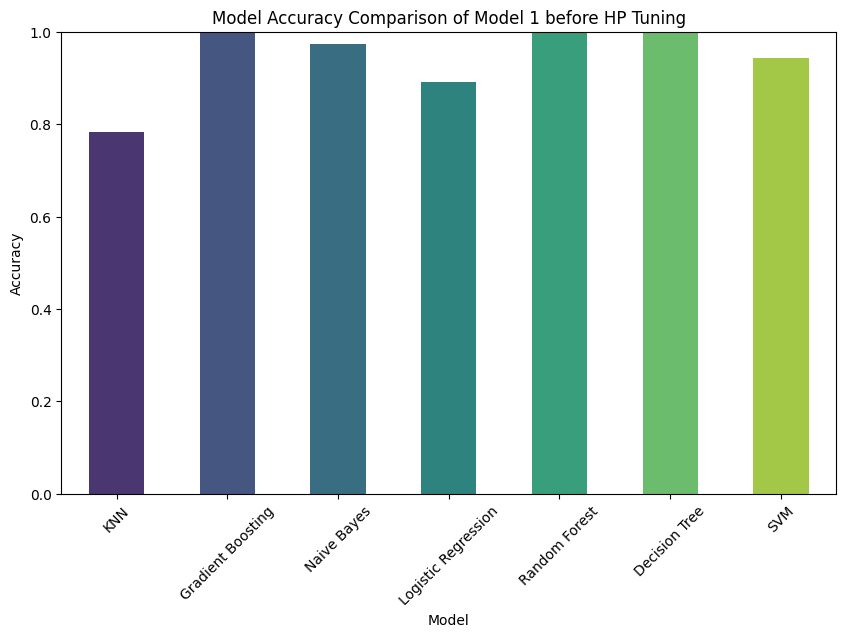

<ipython-input-46-6a8f7d8a66c7>:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here


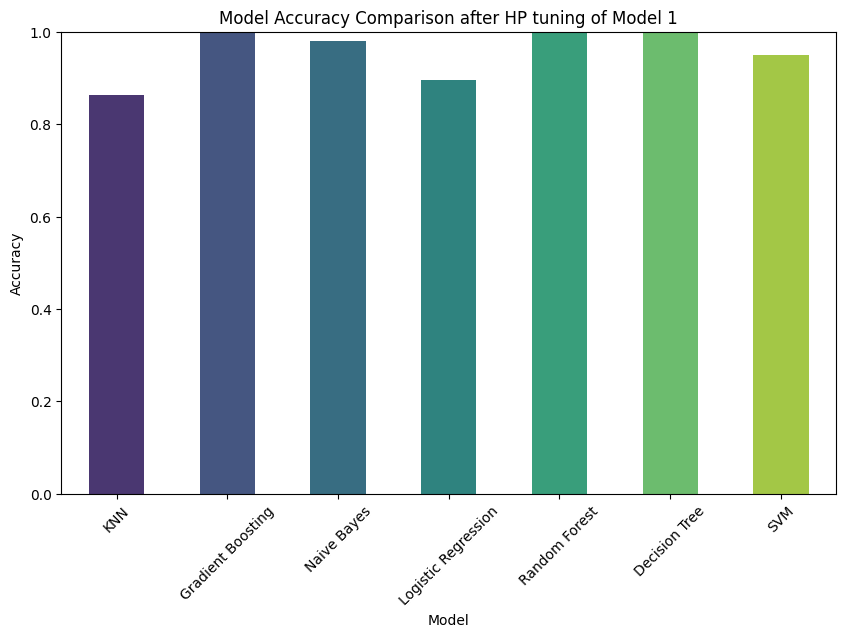

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dictionary with model names as keys and accuracy scores as values
model_results1 = {
    'KNN': 0.782,
    'Gradient Boosting': 0.9997,
    'Naive Bayes': 0.974,
    'Logistic Regression': 0.8907,
    'Random Forest': 0.9997,
    'Decision Tree': 0.9997,
    'SVM': 0.9423
}

# Plotting the barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_results1.keys()), y=list(model_results1.values()), width=0.5, palette='viridis')  # Adjust width here
plt.title('Model Accuracy Comparison of Model 1 before HP Tuning')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set the y-axis limit from 0 to 1 for accuracy percentage

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

# Create a dictionary with model names as keys and accuracy scores as values
model_results = {
    'KNN': 0.863,
    'Gradient Boosting': 1.0,
    'Naive Bayes': 0.98,
    'Logistic Regression': 0.895,
    'Random Forest': 1.0,
    'Decision Tree': 1.0,
    'SVM': 0.95}

# Plotting the barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(model_results.keys()), y=list(model_results.values()), width=0.5, palette='viridis')  # Adjust width here
plt.title('Model Accuracy Comparison after HP tuning of Model 1')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set the y-axis limit from 0 to 1 for accuracy percentage

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

**Comparison of model performance before and after hyperparameter tuning**

**Logistic Regression** shows consistent performance with training accuracy of 89.5% and test accuracy of 90%, both before and after tuning. This indicates that the model is well-optimized, and there is no indication of overfitting or underfitting. It performs similarly on both the training and test datasets, which is ideal for generalization.

**K-Nearest Neighbors (KNN)** exhibits relatively lower performance, with training accuracy at 86.3% and test accuracy at 79% both before and after tuning. This model appears to be underfitting, as the significant gap between the training and test accuracies suggests that KNN is unable to capture the complexity of the dataset effectively. Despite tuning, the model fails to improve substantially, indicating that KNN may not be the best choice for this task.

**Naive Bayes** shows high training accuracy (98%) and test accuracy (97.4%) before and after hyperparameter tuning, with no significant change in performance. This suggests that the model is performing quite well. The minimal gap between training and test accuracy indicates that the model's complexity is well-suited to the dataset.

**Gradient Boosting**, **Random Forest** and **Decision Tree** show perfect performance with training and test accuracies of 100% before and after tuning.

**Support Vector Machines (SVM)** show stable performance with training accuracy at 95% and test accuracy at 94.6% before and after tuning. This suggests that the model is not overfitting or underfitting but is rather generalizing well. The consistency between the training and test accuracies indicates that SVM strikes a good balance between bias and variance.

In summary, **overfitting** is most evident in the ensemble models (Gradient Boosting, Random Forest, and Decision Tree) due to their perfect training and test accuracy scores but it has been evaluated, while **underfitting** is suggested by KNN's poor performance. **Logistic Regression** and **Naive Bayes** appear well-optimized, with minimal risk of overfitting or underfitting, providing reliable performance across both training and test datasets. **SVM** offers a balanced performance, showing neither overfitting nor underfitting tendencies.

**7.1 Comparison of Model Performance and Effectiveness**


The comparison of all seven models reveals distinct performance characteristics and suitability for the given classification problem. The models display varied results in terms of accuracy, precision, recall, F1 score and AUC-ROC, offering insights into their strengths and weaknesses for this task.


Before tuning, Logistic Regression had an accuracy of 90%, with decent precision (0.920) and recall (0.928). After tuning with optimal parameters C: 10 and solver: 'liblinear', the model improved significantly, achieving an accuracy of 96.7%. Precision rose to 0.977 and recall to 0.972, with the F1-score increasing to 0.974. The AUC-ROC also improved substantially to approximately 0.997, indicating a strong ability to differentiate between classes. The confusion matrix showed fewer false positives and false negatives, further reflecting its improved performance after tuning. Logistic Regression offers a good balance between performance and explainability, making it suitable for tasks where interpretability is crucial.


KNN started with an accuracy of 79%, precision of 0.837, and recall of 0.842, with an AUC-ROC of 0.845. After hyperparameter tuning (algorithm: 'auto', n_neighbors: 9, weights: 'distance'), the accuracy slightly increased to 80%, and recall improved to 0.862, though precision remained consistent at 0.837. The F1 score increased to 0.850, and the AUC-ROC improved to 0.867. While KNN showed modest improvements, it still underperformed compared to more complex models like Random Forest and Gradient Boosting. The results highlight the limitations of KNN in handling complex datasets with intricate decision boundaries.


Random Forest initially achieved perfect accuracy of 100%, with no false positives or false negatives. After hyperparameter tuning, it retained its 100% accuracy, precision, and recall, with an AUC-ROC of 1.0. These results demonstrate the model’s ability to capture complex patterns and interactions in the data, leading to perfect classification performance.


Before tuning, Gradient Boosting showed an almost perfect performance with 100% accuracy, precision, and recall. After tuning, the best parameters were learning_rate: 0.01, max_depth: 3, and n_estimators: 100, maintaining its high performance with 100% accuracy, precision, recall, and AUC-ROC close to 1.0. Like Random Forest, Gradient Boosting displayed excellent performance on this task, confirming the strength of ensemble methods in capturing complex patterns in data.

Naive Bayes initially achieved a high accuracy of 97.4%, with high precision (0.990) and recall (0.969), and an AUC-ROC of 0.998. This model showed strong performance despite its simplicity. After tuning, the results remained consistent, with no significant changes in performance. Naive Bayes is efficient and works well in scenarios where the data is not complex and assumptions of conditional independence hold. It is especially valuable in cases where minimal data preprocessing is required, but it is outperformed by the more complex models like Random Forest and Gradient Boosting in terms of overall accuracy and F1-score.


Decision Tree initially displayed perfect performance with 100% accuracy, precision, and recall, and an AUC-ROC of 0.9996. After tuning, the model continued to perform excellently with 100% accuracy, precision, and recall, and an AUC-ROC of 0.9996.

SVM showed high performance with an accuracy of 94.6%, precision of 0.992, recall of 0.988, and AUC-ROC of 0.9993. While SVM provided strong classification performance, it did not outperform the ensemble methods, which consistently led in all performance metrics. SVM is effective when the data has a clear decision boundary and it performed well here. However, its performance was slightly edged out by the ensemble models, which excelled at capturing more complex patterns in the data.


**7.2 Conclusion**

In this report, we have compared the performance of seven machine learning models Logistic Regression, K-Nearest Neighbors, Random Forest, Gradient Boosting, Naive Bayes, Decision Tree and Support Vector Machines on a classification problem. The models were evaluated based on key metrics such as accuracy, precision, recall, F1-score and AUC-ROC, with an emphasis on hyperparameter tuning to optimize each model's performance.

The ensemble models, specifically Random Forest, Gradient Boosting and Decision Tree, demonstrated the highest performance, achieving near-perfect classification results with 100% accuracy, precision, and recall after tuning. These models excel at capturing complex patterns and interactions within the dataset, though they raised concerns about potential overfitting, which might hinder generalization to new data.

Logistic Regression showed notable improvements after hyperparameter tuning, reaching a strong 96.7% accuracy with high precision and recall, making it an excellent choice for scenarios that require both solid performance and interpretability.

Naive Bayes performed well with an accuracy of 97.4% and a high AUC-ROC score, proving to be efficient and effective for simpler tasks. However, it could not match the performance of the more complex models in this specific dataset.

Support Vector Machines offered competitive results with 94.6% accuracy and an AUC-ROC of 0.9993, although it was slightly outperformed by the ensemble models.

Lastly, K-Nearest Neighbors showed the smallest improvement after tuning, with an accuracy of only 80% and an AUC-ROC of 0.867, making it the least effective model for this dataset, especially given the complexity of the feature space and decision boundaries.

Ranking the Models(From Best to Worst):

1. Random Forest – Perfect performance, though potential overfitting is a concern and has been evaluated
2. Gradient Boosting – Strong performance with minimal tuning required, though similar concerns regarding overfitting.

3. Decision Tree – Perfect performance with simple configurations, but the same overfitting concerns as Random Forest and Gradient Boosting.
4. Logistic Regression – Solid performance after tuning, suitable for tasks requiring both high performance and interpretability.
5. Naive Bayes – Efficient and simple, performing well but slightly behind the more complex models.
6. Support Vector Machines (SVM) – Strong performance, but did not outperform the top ensemble models.
7. K-Nearest Neighbors (KNN) – Least effective, with only modest improvements and relatively poor performance compared to other models.

This ranking suggests that for high-performance, complex classification tasks, ensemble methods like Random Forest and Gradient Boosting are ideal, but caution should be taken to avoid overfitting. Logistic Regression strikes a balance between interpretability and performance, while simpler models like Naive Bayes and SVM may be preferred in less complex scenarios. KNN is the least suitable model for this task based on the given dataset's characteristics.